# Exploratory Analysis of Water Quality Data

This document includes Python code and results of the exploratory analysis of water quality data in the SEACAR Pilot project.

In [2]:
import matplotlib.pyplot as plt
import numpy      as np
import pandas     as pd
import geopandas  as gpd
import contextily as cx
import seaborn    as sns
import matplotlib.colors

## 1. Data preprocessing
Read the csv file of data.

In [3]:
df      = pd.read_csv("OEAT_Discrete-2022-Aug-31.csv")
areaShp = gpd.read_file("ORCP_Managed_Areas_Oct2021.shp")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_10036\3086028085.py:1: DtypeWarning: Columns (6,17,18,19,20,21) have mixed types. Specify dtype option on import or set low_memory=False.
  df      = pd.read_csv("OEAT_Discrete-2022-Aug-31.csv")


Select five managed areas and five parameters. Select only columns that are needed for the analysis. Convert the SampleDate from string to datetime object.

In [4]:
df2 = df.loc[df["ManagedAreaName"].isin(["Guana Tolomato Matanzas National Estuarine Research Reserve",
                            "Biscayne Bay Aquatic Preserve",
                            "Estero Bay Aquatic Preserve",
                            "Gasparilla Sound-Charlotte Harbor Aquatic Preserve",
                            "Big Bend Seagrasses Aquatic Preserve"])]
df2 = df2[['RowID','ParameterName','ParameterUnits','ProgramLocationID','ActivityType','ManagedAreaName',
           'SampleDate','Year','Month','ResultValue','ValueQualifier','Latitude_DD','Longitude_DD']]
df2 = df2.loc[df2["ParameterName"].isin(["Salinity","Total Nitrogen","Dissolved Oxygen","Turbidity","Secchi Depth"])]
df2["timestamp"]=  pd.to_datetime(df2['SampleDate'])
df2.head()

,RowID,ParameterName,ParameterUnits,ProgramLocationID,ActivityType,ManagedAreaName,SampleDate,Year,Month,ResultValue,ValueQualifier,Latitude_DD,Longitude_DD,timestamp
22,23,Dissolved Oxygen,mg/L,FLW06-0041,Field,Gasparilla Sound-Charlotte Harbor Aquatic Pres...,2006-12-31,2006,12,5.5,NaN,26.83697,-82.09640,2006-12-31
23,24,Dissolved Oxygen,mg/L,FL00-0020,Field,Gasparilla Sound-Charlotte Harbor Aquatic Pres...,2000-12-31,2000,12,5.0,NaN,26.75800,-82.08850,2000-12-31
24,25,Dissolved Oxygen,mg/L,FL00-0011,Field,Big Bend Seagrasses Aquatic Preserve,2000-12-31,2000,12,9.6,NaN,29.15600,-83.05780,2000-12-31
25,26,Dissolved Oxygen,mg/L,FLW05-0020,Field,Big Bend Seagrasses Aquatic Preserve,2005-12-31,2005,12,6.7,NaN,30.07050,-84.10702,2005-12-31
26,27,Dissolved Oxygen,mg/L,FL01-0014,Field,Gasparilla Sound-Charlotte Harbor Aquatic Pres...,2001-12-31,2001,12,5.0,NaN,26.75900,-82.07900,2001-12-31


Remove outliers.

In [5]:
# Remove total nitrogen outliers (>100)
df2.drop(df2[(df2['ParameterName'] == 'Total Nitrogen') & 
    (df2['ResultValue'] > 100)].index,inplace=True)

# Remove a single measurement in 1996-07-22 (RowID: 1582917)
df2.drop(df2[df2['RowID'] == 1582917].index, inplace=True)

# Remove turbidity outliers (>25)
df2.drop(df2[(df2['ParameterName'] == 'Turbidity') & 
    (df2['ResultValue'] > 25)].index, inplace=True)

# Remove Secchi Depth before 1995 (117 records)
df2.drop(df2[(df2['ParameterName'] == 'Secchi Depth') & 
    (df2['Year'] < 1995)].index, inplace=True)

## 2. Exploratory Analysis
Create lists of water quality parameters, lists of five managed areas and list of statistics to be calculated.

In [6]:
listPara = ["Salinity","Total Nitrogen","Dissolved Oxygen","Turbidity","Secchi Depth"] 
listArea = ["Guana Tolomato Matanzas National Estuarine Research Reserve",
                            "Biscayne Bay Aquatic Preserve",
                            "Estero Bay Aquatic Preserve",
                            "Gasparilla Sound-Charlotte Harbor Aquatic Preserve",
                            "Big Bend Seagrasses Aquatic Preserve" ]
listValue = ["count", "mean","max","min","std"]
dictUnits = {"Salinity":"ppt","Total Nitrogen": "mg/L","Dissolved Oxygen": "mg/L","Turbidity": "NTU", "Secchi Depth": "m"}
dictMonth = {1:"January",2:"February",3:"March",4:"April",5:"May",6:"June",7:"July",8:"August",
             9:"September",10:"October",11:"November",12:"December"}

Calculate each parameters' Count, Max, Min, Mean, and STD of each areas in weekly, monthly, quarterly and yearly intervals.

In [7]:
weekly_count     = df2.groupby(["ParameterName","ManagedAreaName","ParameterUnits",pd.Grouper(key="timestamp",freq="W")])[
    "ResultValue"].agg(["count","max","min","mean","std"]).sort_values("timestamp").reset_index()
monthly_count    = df2.groupby(["ParameterName","ManagedAreaName","ParameterUnits",pd.Grouper(key="timestamp",freq="M")])[
    "ResultValue"].agg(["count","max","min","mean","std"]).sort_values("timestamp").reset_index()
quarterly_count  = df2.groupby(["ParameterName","ManagedAreaName","ParameterUnits",pd.Grouper(key="timestamp",freq="Q")])[
    "ResultValue"].agg(["count","max","min","mean","std"]).sort_values("timestamp").reset_index()
yearly_count     = df2.groupby(["ParameterName","ManagedAreaName","ParameterUnits",pd.Grouper(key="timestamp",freq="Y")])[
    "ResultValue"].agg(["count","max","min","mean","std"]).sort_values("timestamp").reset_index()

### 2.1 Weekly Count
Create line charts for sample **counts** in **weekly** intervals. The weekly results show that the number of samples fluctuate from week to week. Some areas have less than 5 data samples in some weeks. Spatial interpolation from the few samples may have high and fluctuating uncertainty. **Thus, spatial interpolation in weekly intervals is NOT practical**. 

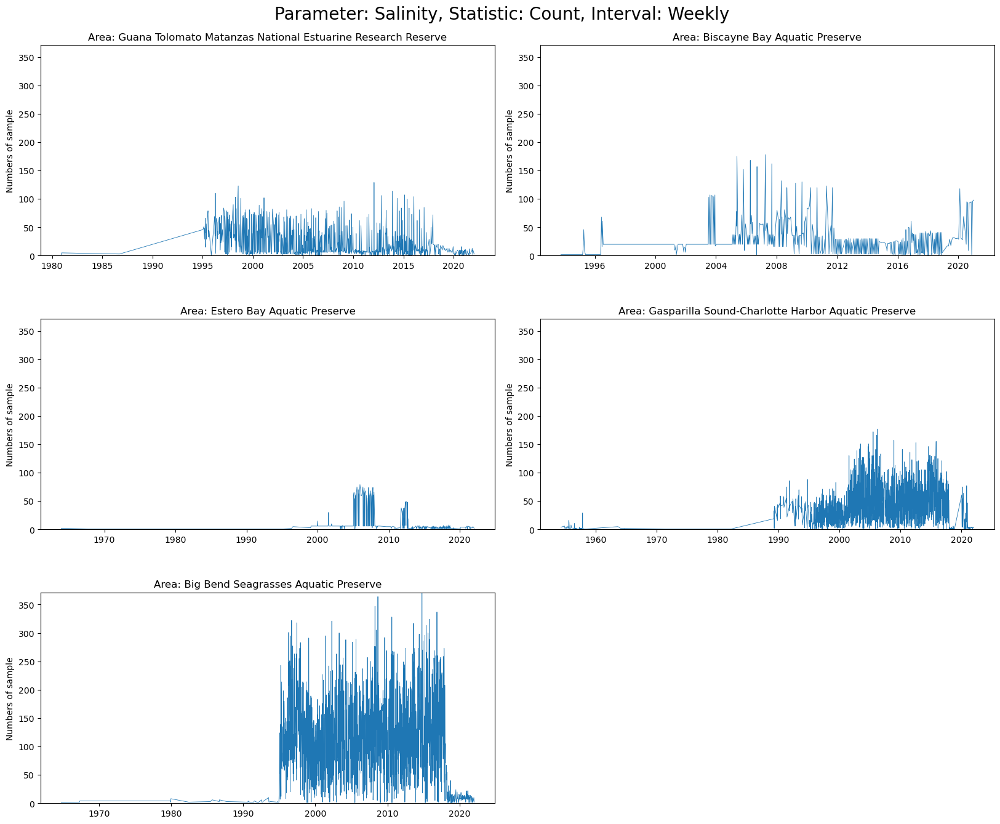

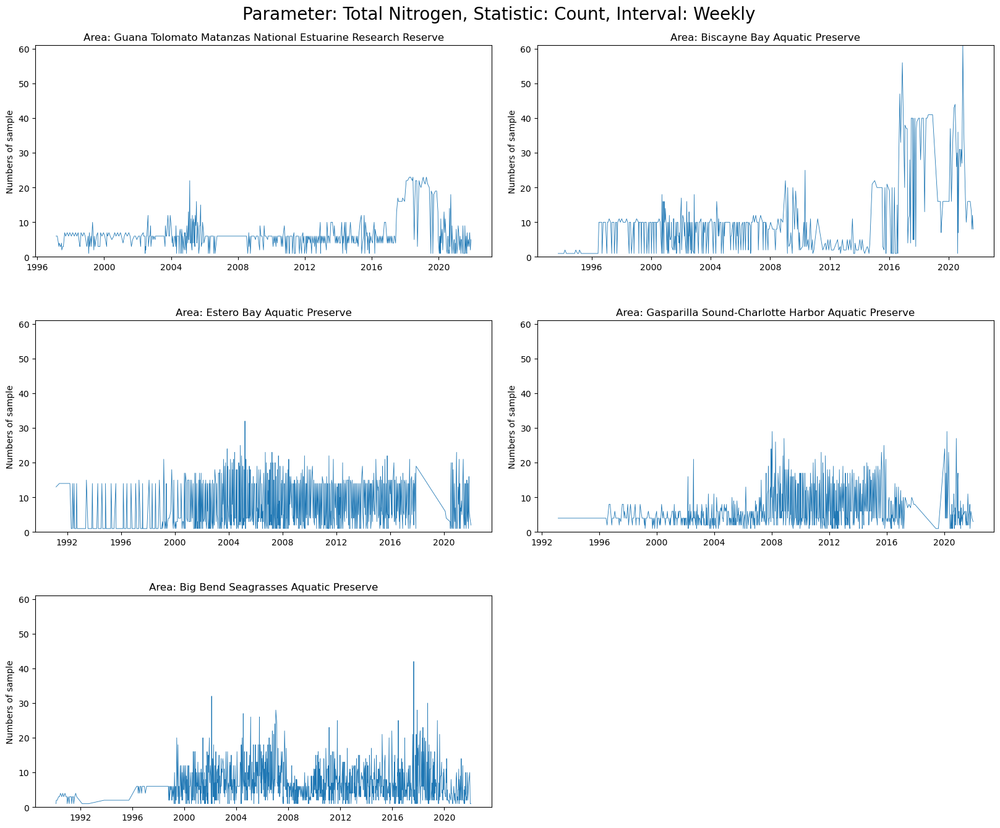

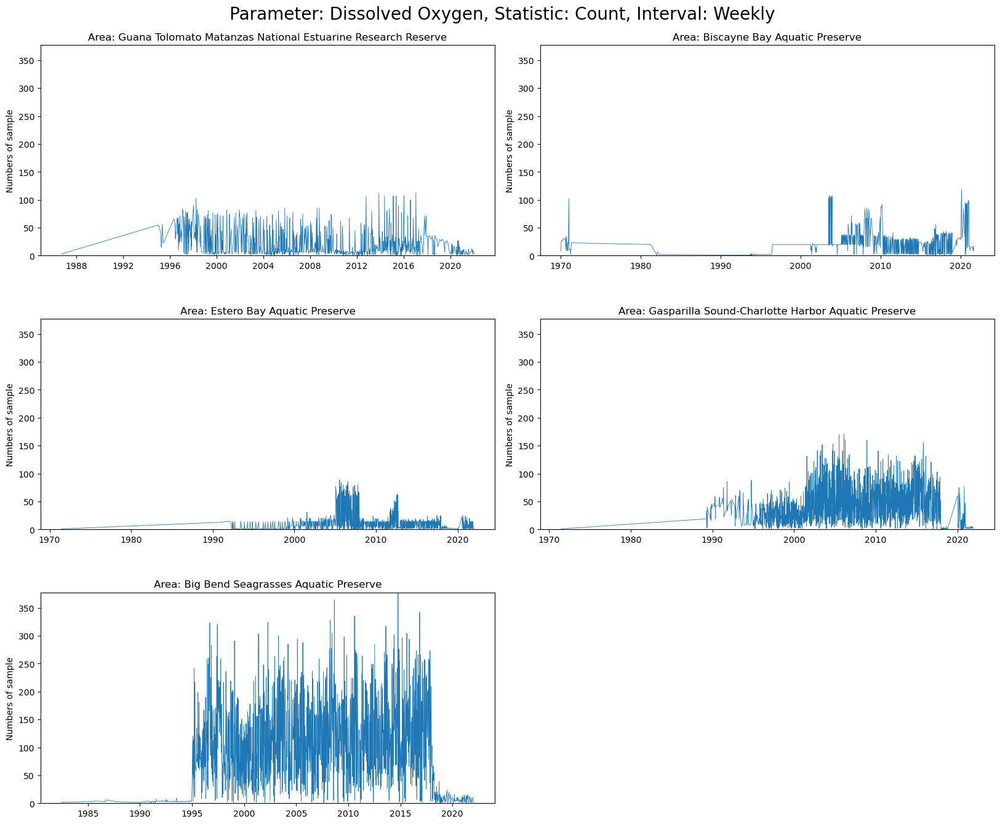

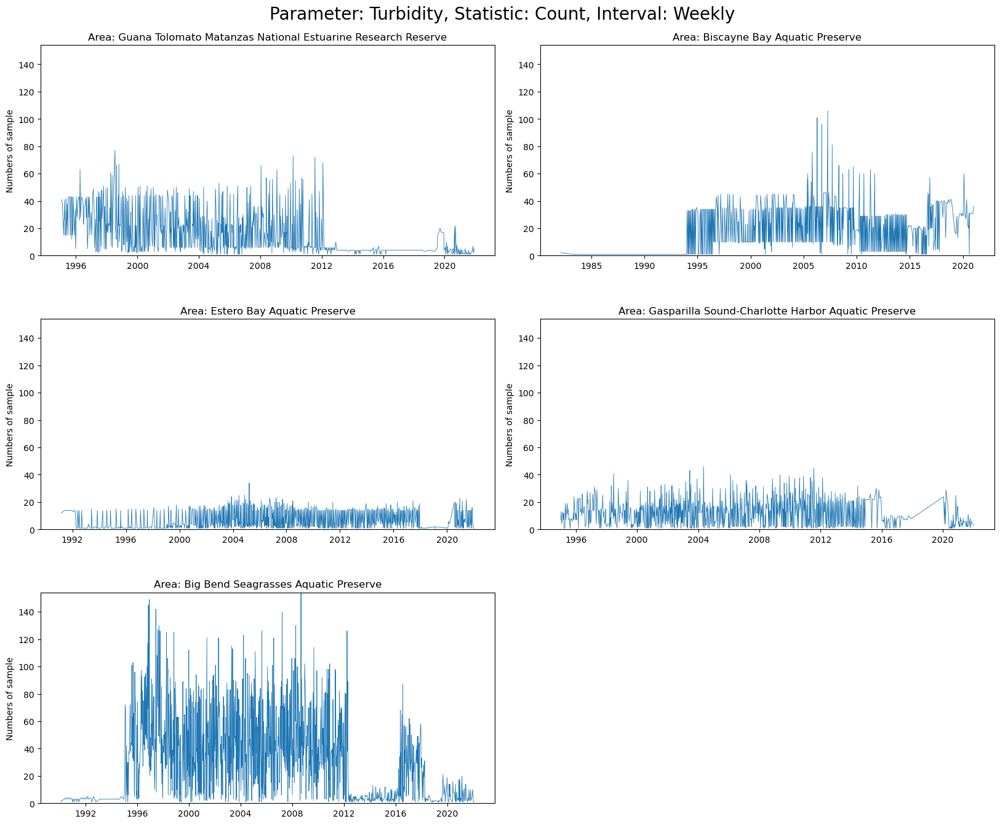

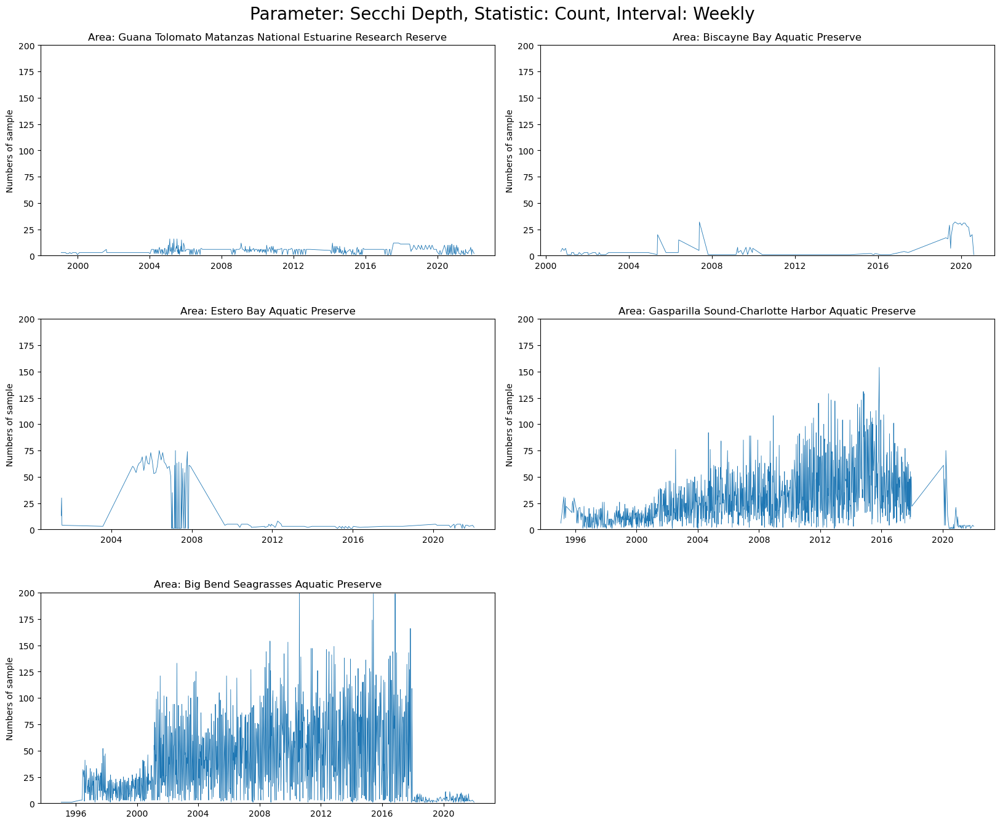

In [8]:
plt.rcParams['figure.figsize'] = [20, 16]
#for value in listValue:
value = listValue[0]
for para in listPara:
    fig = plt.figure()
    # Create the main title
    plt.suptitle("Parameter: " + para + ", Statistic: " + value.capitalize() + ", Interval: Weekly", fontsize = 20, y = 0.92)
    # Calculate the upper limit of y axis
    up_lim = weekly_count[(weekly_count["ParameterName"] == para)]['count'].max()
    for i in range(len(listArea)):
        dfNew = weekly_count[(weekly_count["ParameterName"] == para)&(weekly_count["ManagedAreaName"]== listArea[i])]
        ax = fig.add_subplot(3,2,i+1,title=str('Area: '+ listArea[i]))
        ax.plot(dfNew["timestamp"],dfNew[str(value)],linewidth=0.6)
        ax.set_ylim([0,up_lim])
        plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.1, hspace=0.3)
        plt.ylabel("Numbers of sample")

### 2.2 Monthly Count

Create line charts for sample **counts** in monthly intervals. These line charts shows sampling activity in different time periods.

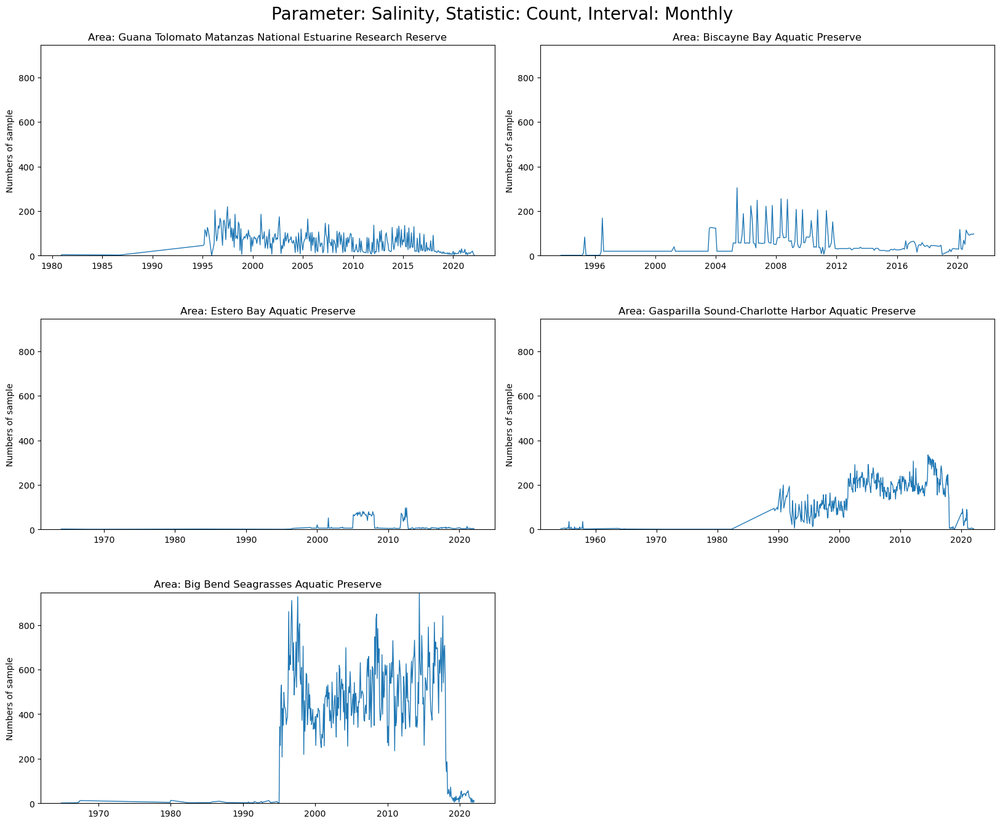

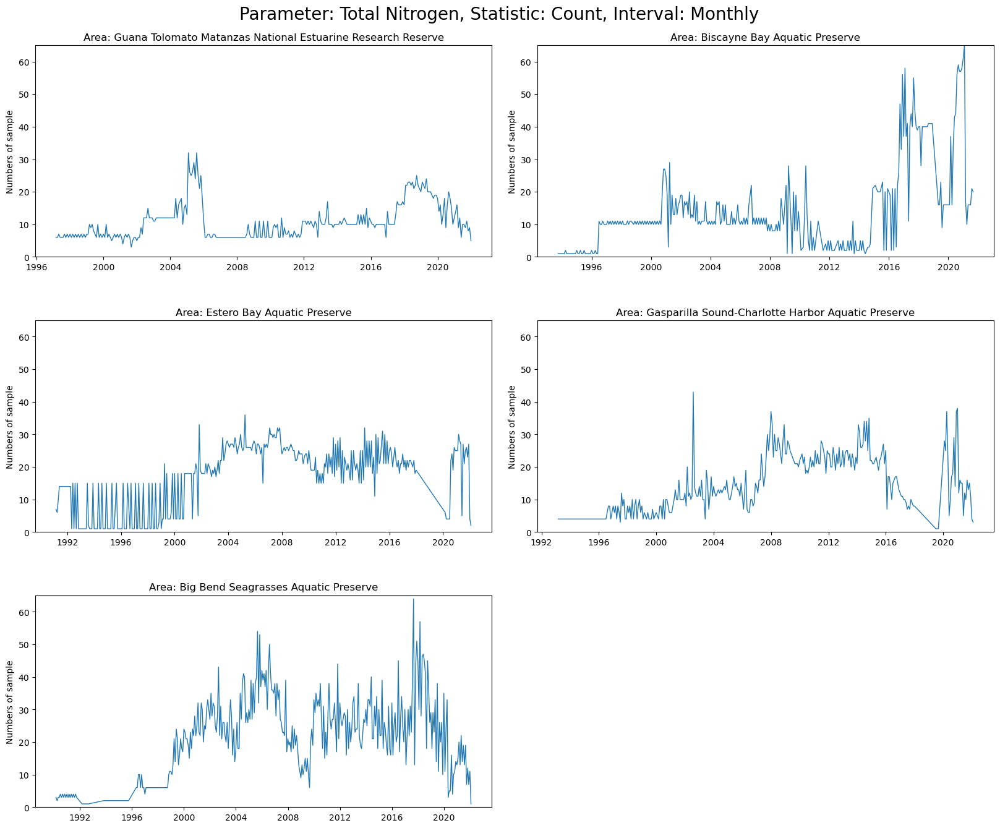

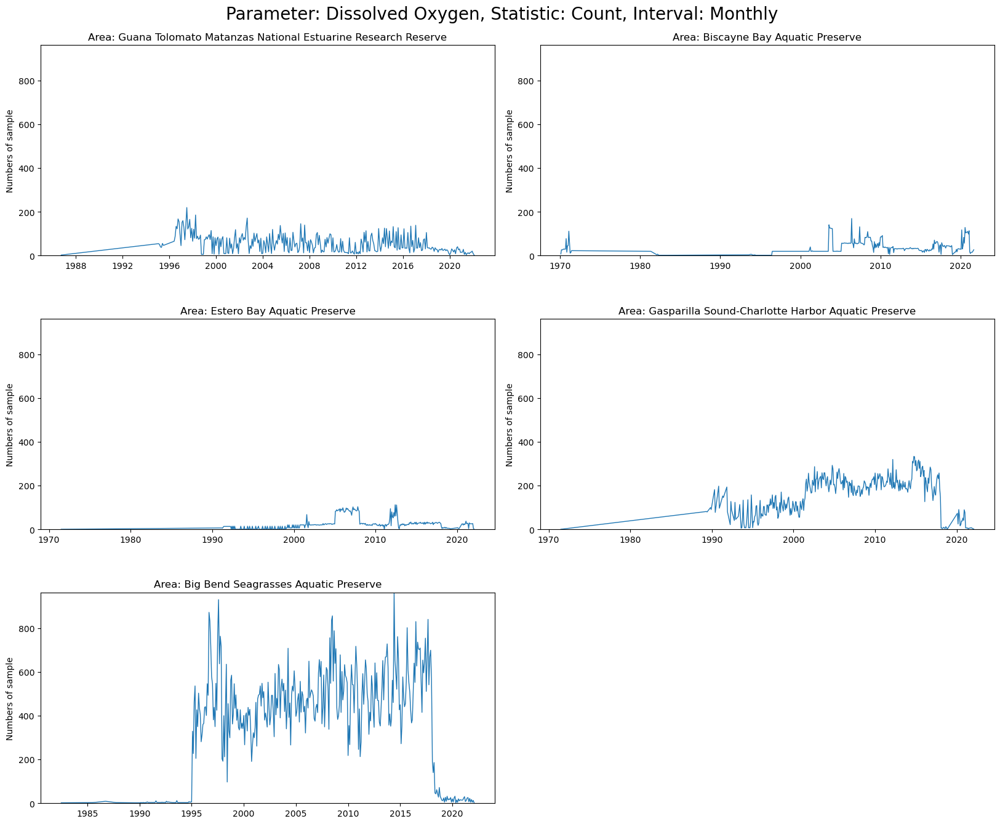

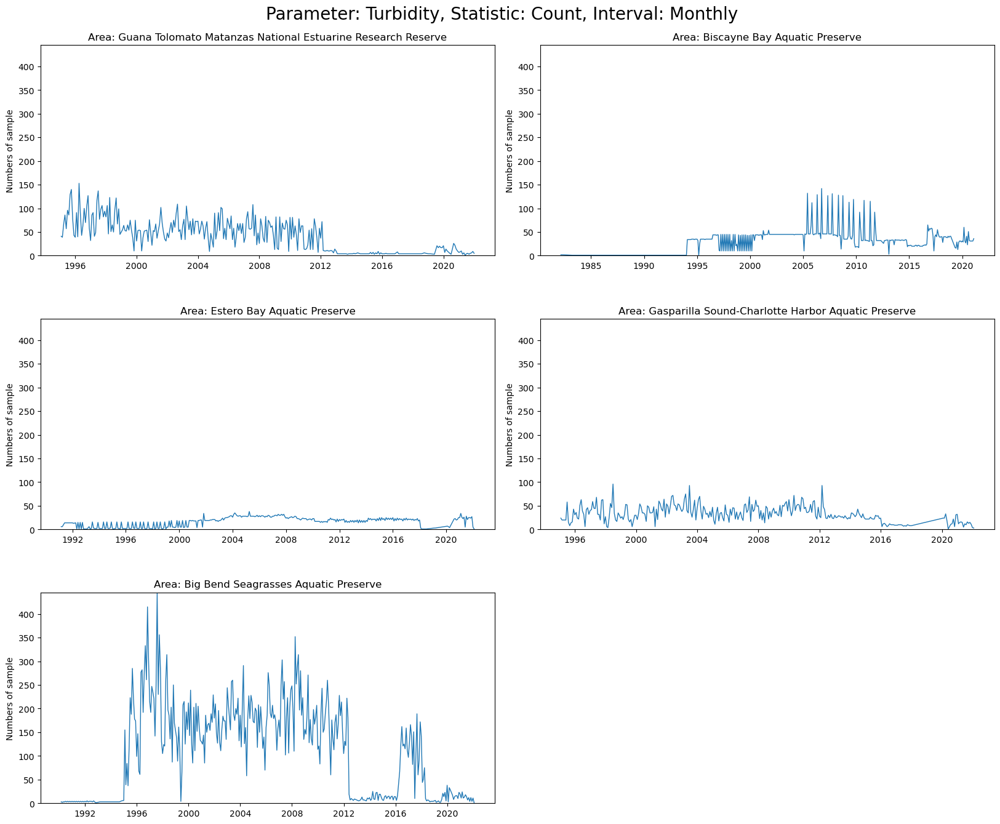

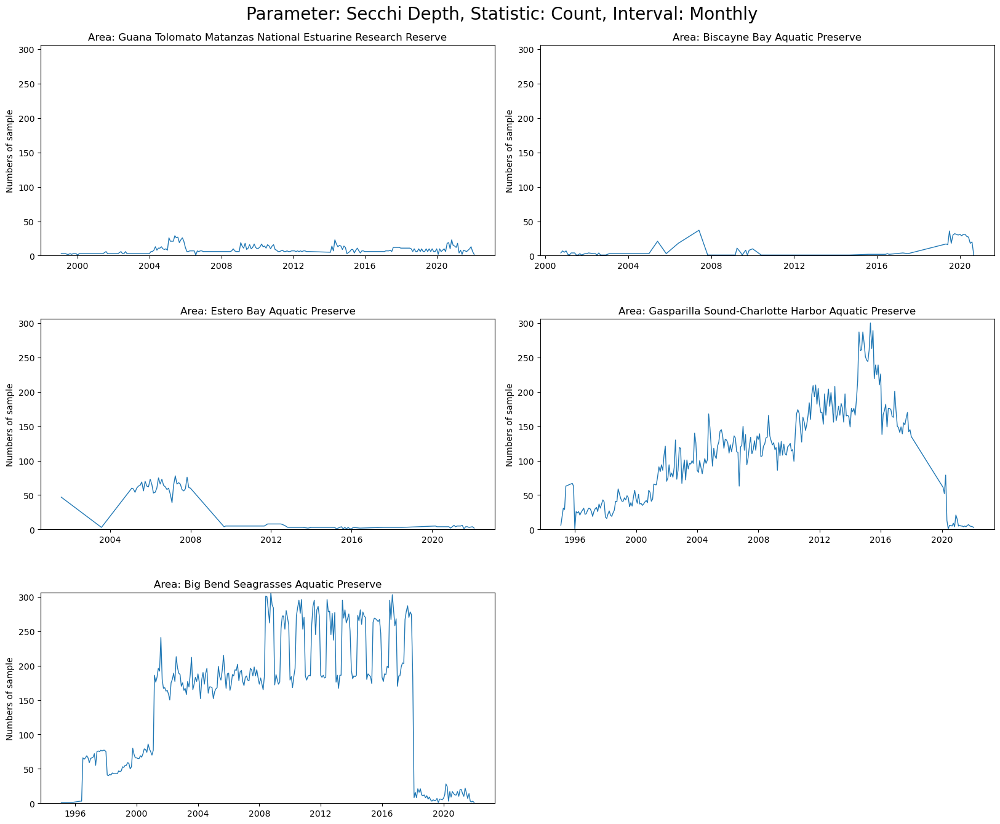

In [9]:
plt.rcParams['figure.figsize'] = [20, 16]
#for value in listValue:
value = listValue[0]
for para in listPara:
    fig = plt.figure()
    # Create the main title
    plt.suptitle("Parameter: " + para + ", Statistic: " + value.capitalize() + ", Interval: Monthly", fontsize = 20, y = 0.92)
    # Calculate the upper limit of y axis
    up_lim = monthly_count[(monthly_count["ParameterName"] == para)]['count'].max()
    for i in range(len(listArea)):
        dfNew = monthly_count[(monthly_count["ParameterName"] == para)&(monthly_count["ManagedAreaName"]== listArea[i])]
        ax = fig.add_subplot(3,2,i+1,title=str('Area: '+ listArea[i]))
        ax.plot(dfNew["timestamp"],dfNew[str(value)],linewidth=1)
        ax.set_ylim([0,up_lim])
        plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.1, hspace=0.3)
        plt.ylabel("Numbers of sample")

### 2.3 Plotting Maximum values in monthly intervals

This is to identify anomalies in the data.

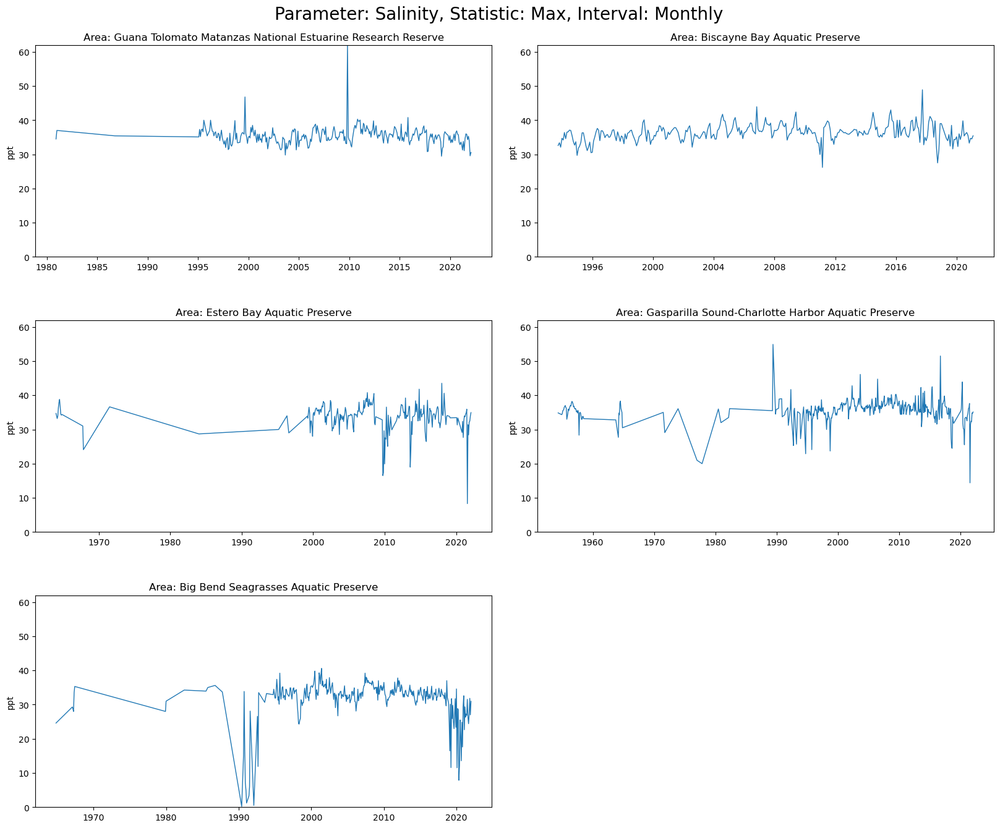

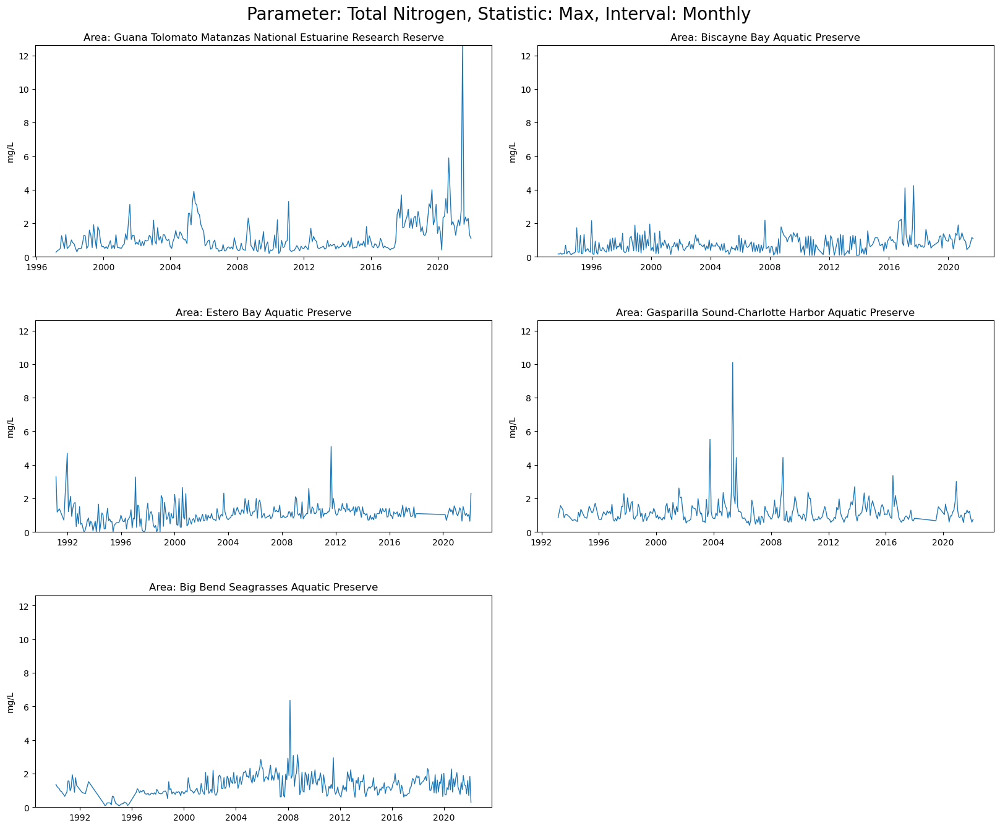

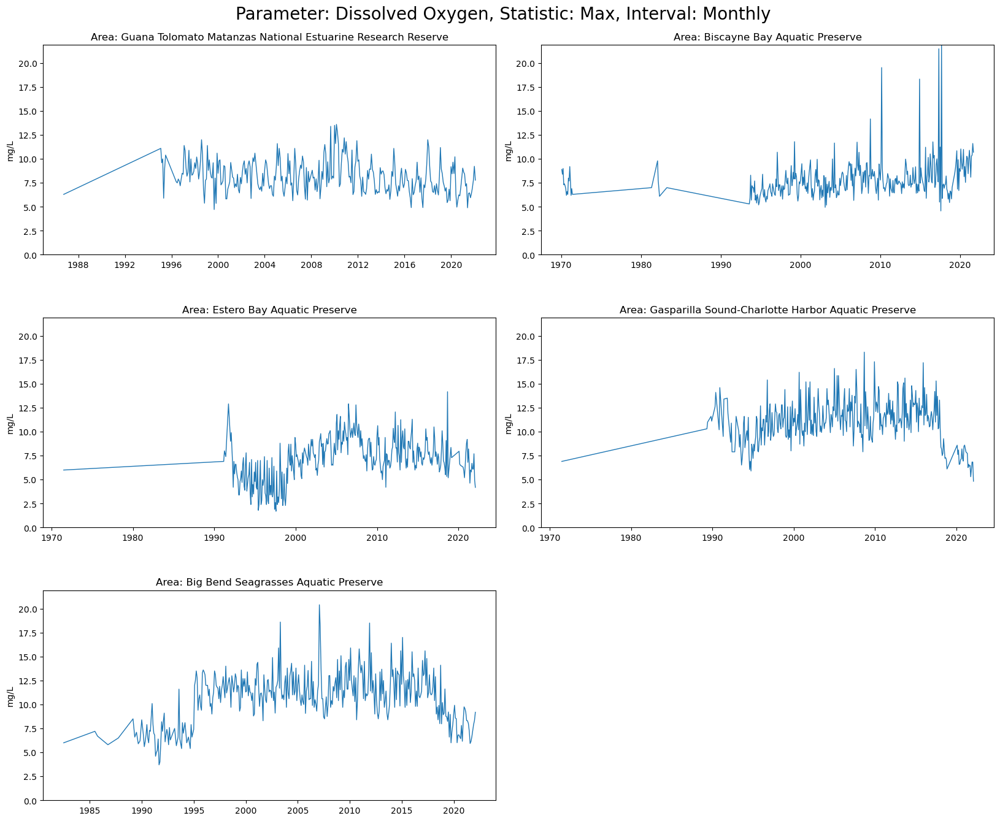

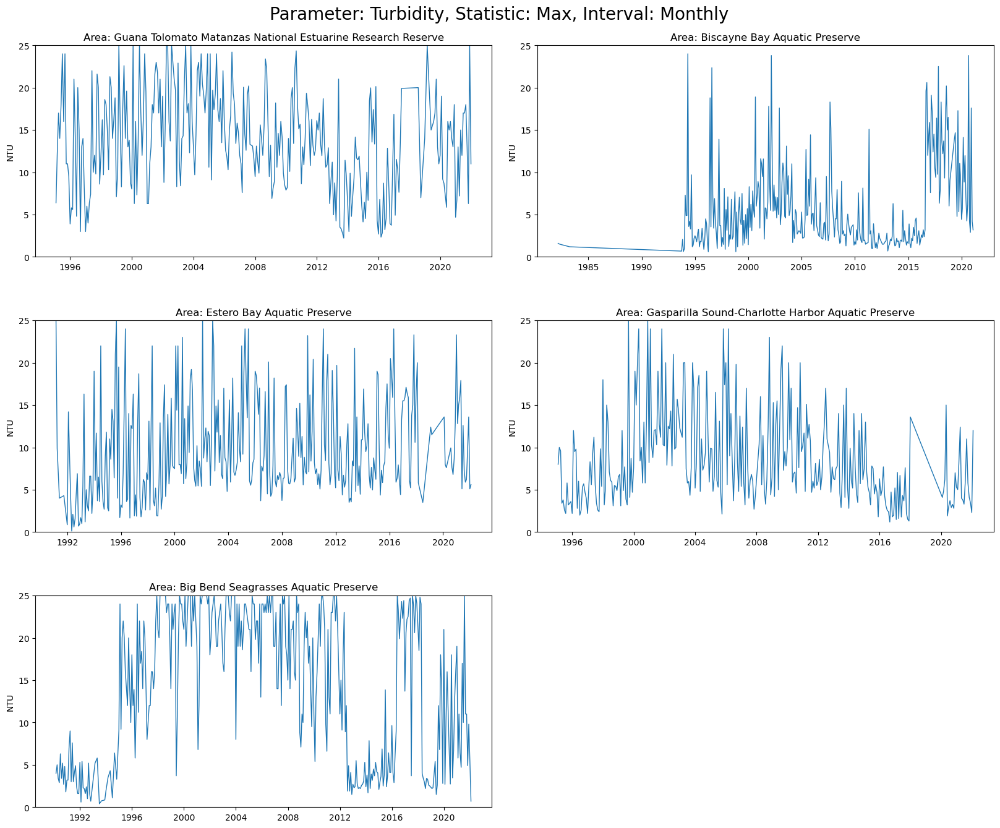

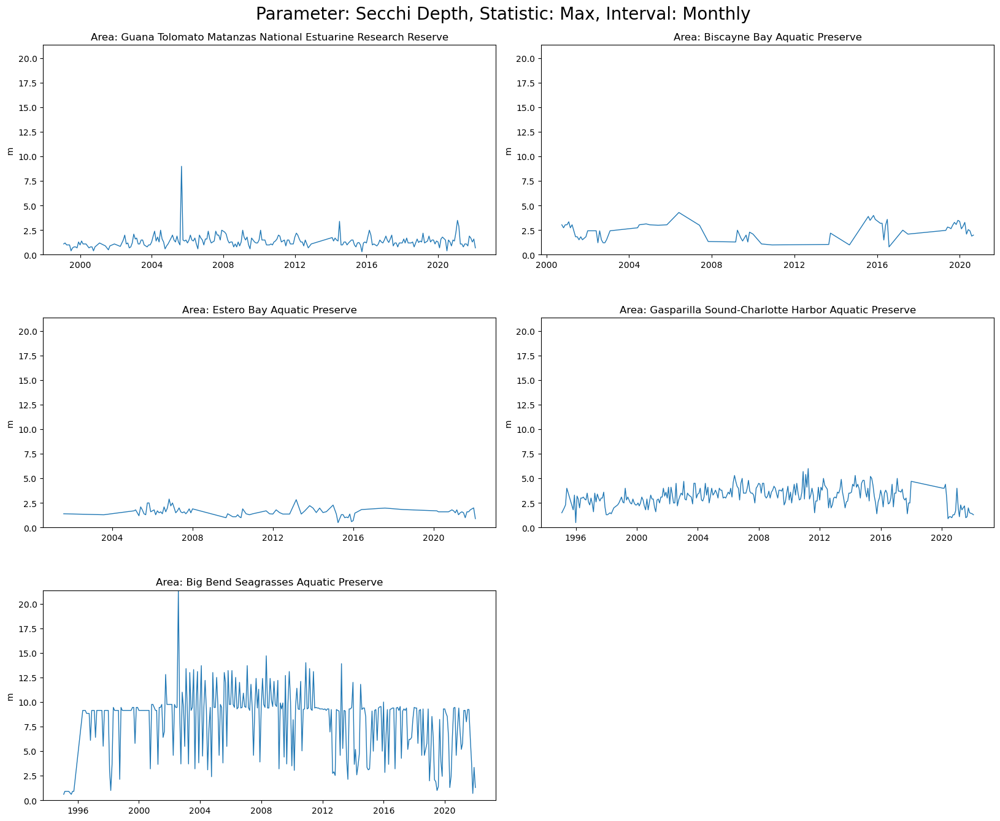

In [10]:
plt.rcParams['figure.figsize'] = [20, 16]
#for value in listValue:
value = 'max'
for para in listPara:
    fig = plt.figure()
    # Create the main title
    plt.suptitle("Parameter: " + para + ", Statistic: " + value.capitalize() + ", Interval: Monthly", fontsize = 20, y = 0.92)
    # Calculate the upper limit of y axis
    up_lim = monthly_count[(monthly_count["ParameterName"] == para)][value].max()
    for i in range(len(listArea)):
        dfNew = monthly_count[(monthly_count["ParameterName"] == para)&(monthly_count["ManagedAreaName"]== listArea[i])]
        ax = fig.add_subplot(3,2,i+1,title=str('Area: '+ listArea[i]))
        ax.plot(dfNew["timestamp"],dfNew[str(value)],linewidth=1)
        ax.set_ylim([0,up_lim])
        plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.1, hspace=0.3)
        plt.ylabel(dictUnits[para])

### 2.3 Monthly Error Bar

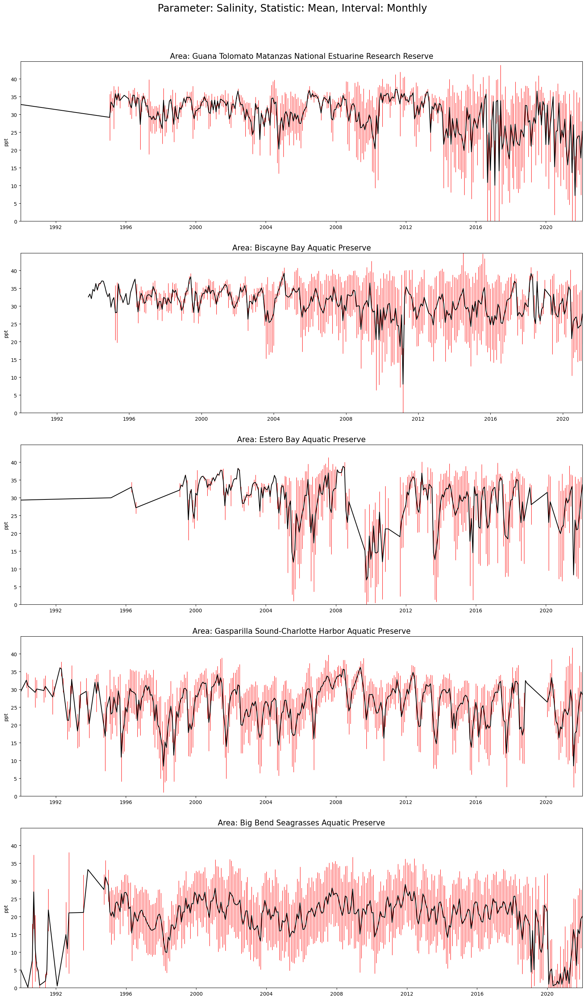

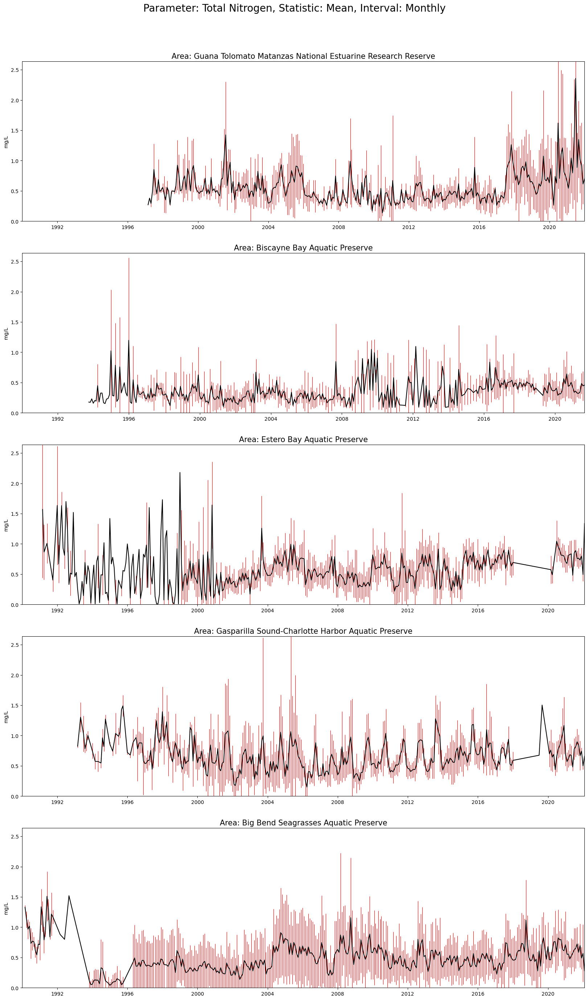

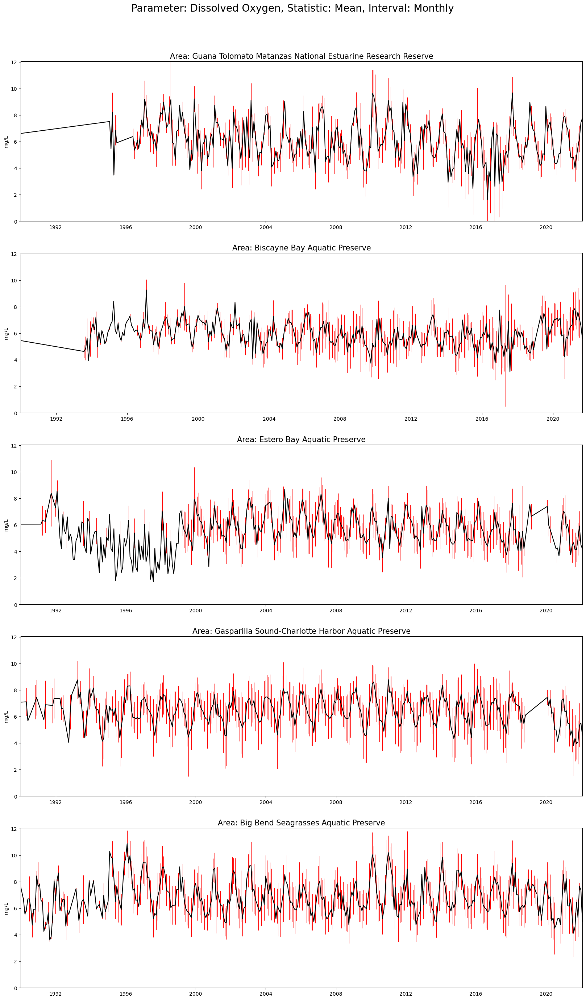

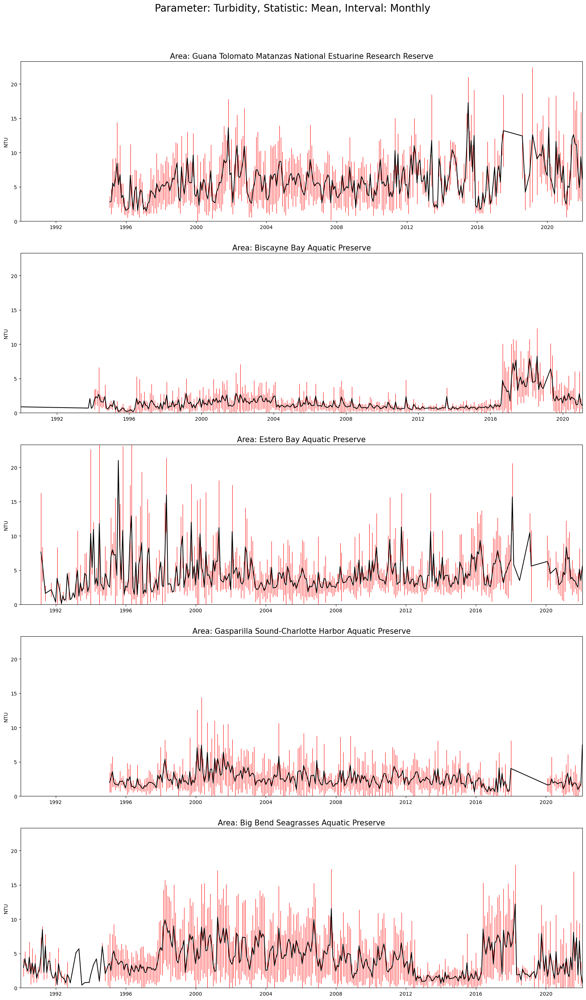

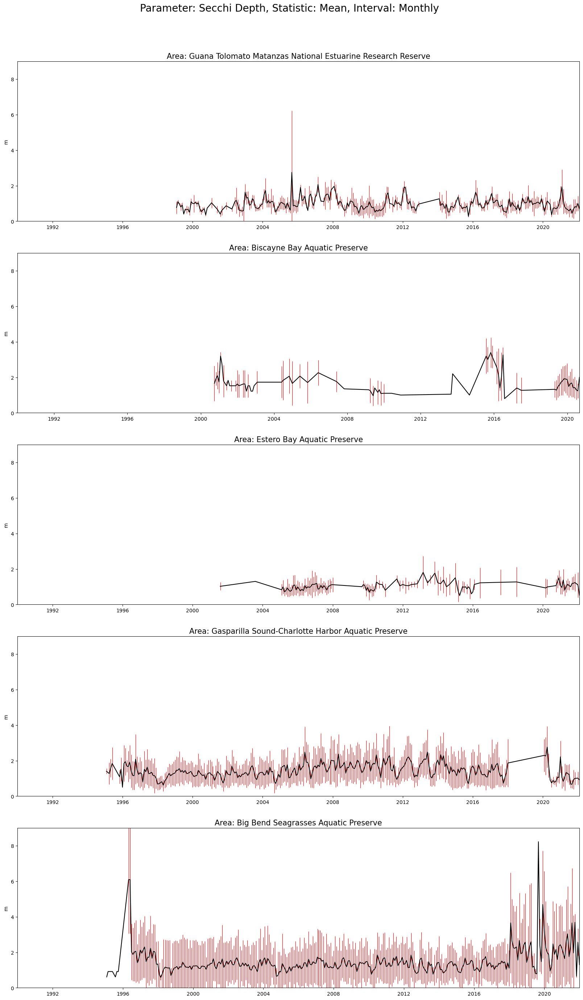

In [11]:
plt.rcParams['figure.figsize'] = [20, 40]
#for value in listValue:
value = listValue[1]
for para in listPara:
    fig = plt.figure()
    # Create the main title
    plt.suptitle("Parameter: " + para + ", Statistic: " + value.capitalize() + ", Interval: Monthly", fontsize = 20, y = 0.92)
    # Calculate the upper limit of y axis
    stats = monthly_count[(monthly_count["ParameterName"] == para)]
    up_lim = stats['mean'].max()+stats['std'].mean()
    for i in range(len(listArea)):
        dfNew = monthly_count[(monthly_count["ParameterName"] == para)&(monthly_count["ManagedAreaName"]== listArea[i])]
        ax = fig.add_subplot(6,1,i+1)
        
        # Set title and font size
        ax.set_title('Area: '+ str(listArea[i]), size=15) # Title
        
        ax.errorbar(dfNew["timestamp"],dfNew['mean'],dfNew['std'],ecolor='red',elinewidth = 0.8,color="black")
        # Set limit of x and y axis
        ax.set_ylim([0,up_lim])
        ax.set_xlim([pd.Timestamp('1990-01-01'),dfNew["timestamp"].max()])
        plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.1)
        plt.ylabel(dictUnits[para])

### 2.4 Yearly Error Bars

Black line is the mean and red lines are -1/+1 standard deviation.

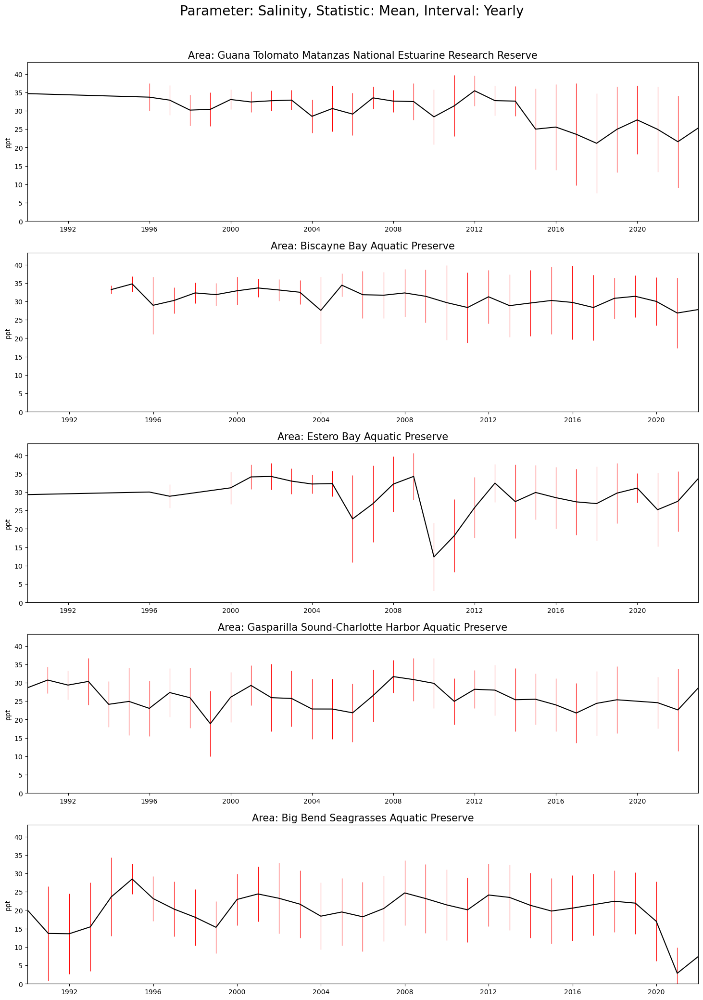

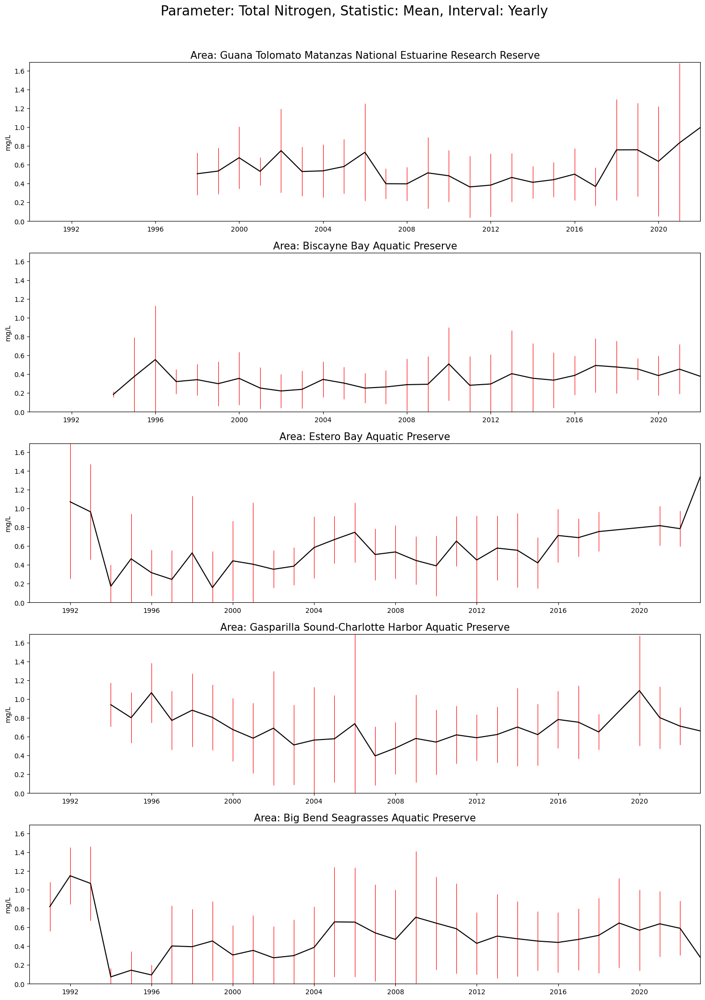

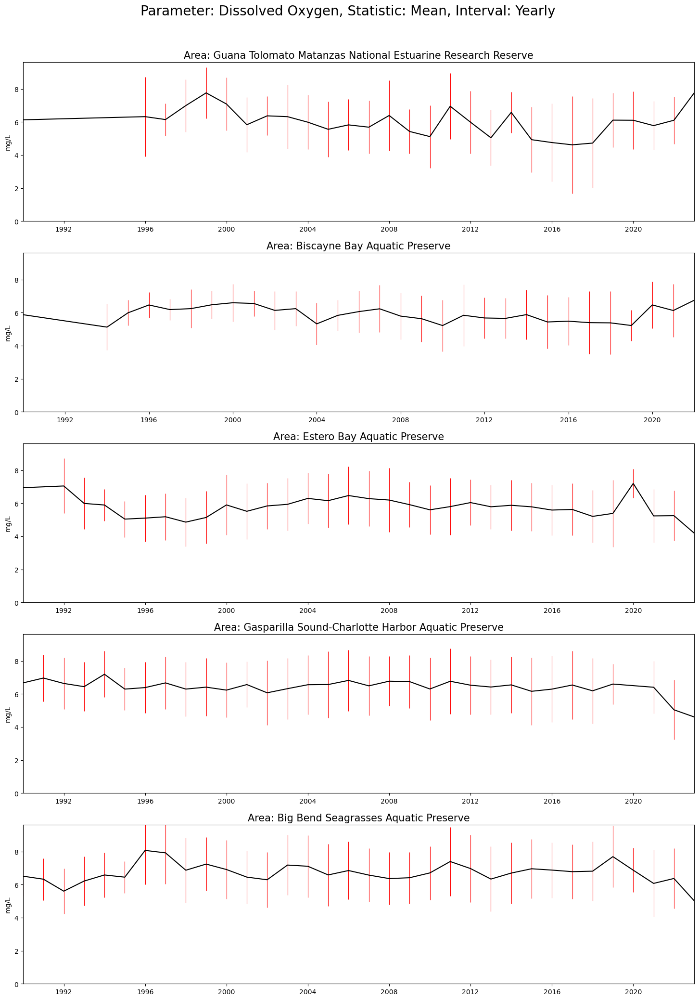

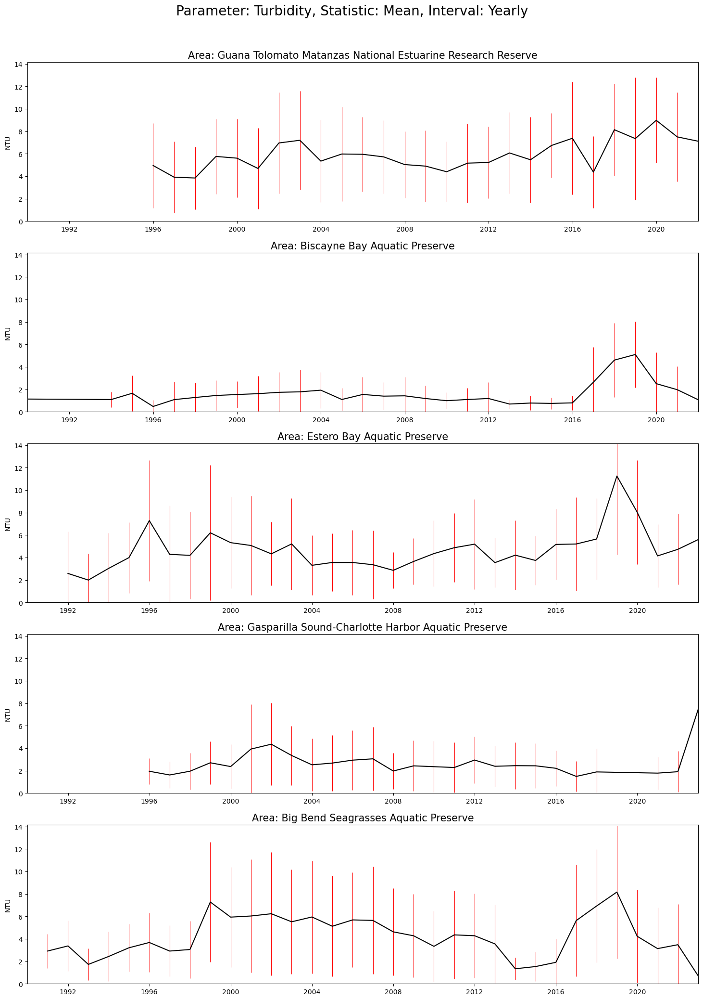

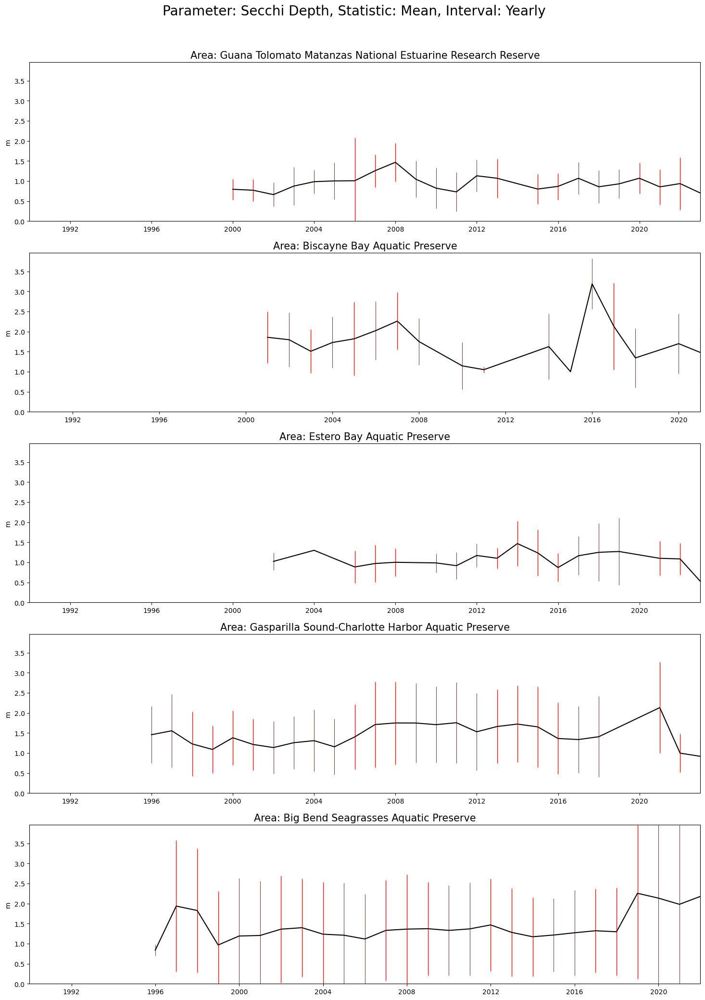

In [12]:
plt.rcParams['figure.figsize'] = [18, 30]
#for value in listValue:
value = listValue[1]
for para in listPara:
    fig = plt.figure()
    # Create the main title
    plt.suptitle("Parameter: " + para + ", Statistic: " + value.capitalize() + ", Interval: Yearly", fontsize = 20, y = 0.92)
    # Calculate the upper limit of y axis
    stats = yearly_count[(yearly_count["ParameterName"] == para)]
    up_lim = stats['mean'].max()+stats['std'].mean()
    for i in range(len(listArea)):
        dfNew = yearly_count[(yearly_count["ParameterName"] == para) & (yearly_count["ManagedAreaName"]== listArea[i])]
        ax = fig.add_subplot(6,1,i+1)
        
        # Set title and font size
        ax.set_title('Area: '+ str(listArea[i]), size=15) # Title
        
        ax.errorbar(dfNew["timestamp"],dfNew['mean'],dfNew['std'],ecolor='red',elinewidth = 0.8,color="black")
        # Set limit of x and y axis
        ax.set_ylim([0,up_lim])
        ax.set_xlim([pd.Timestamp('1990-01-01'),dfNew["timestamp"].max()])
        plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.1)
        plt.ylabel(dictUnits[para])

### 2.5 Statistics by Months

The following boxplots are statistics in the same months in different years. 

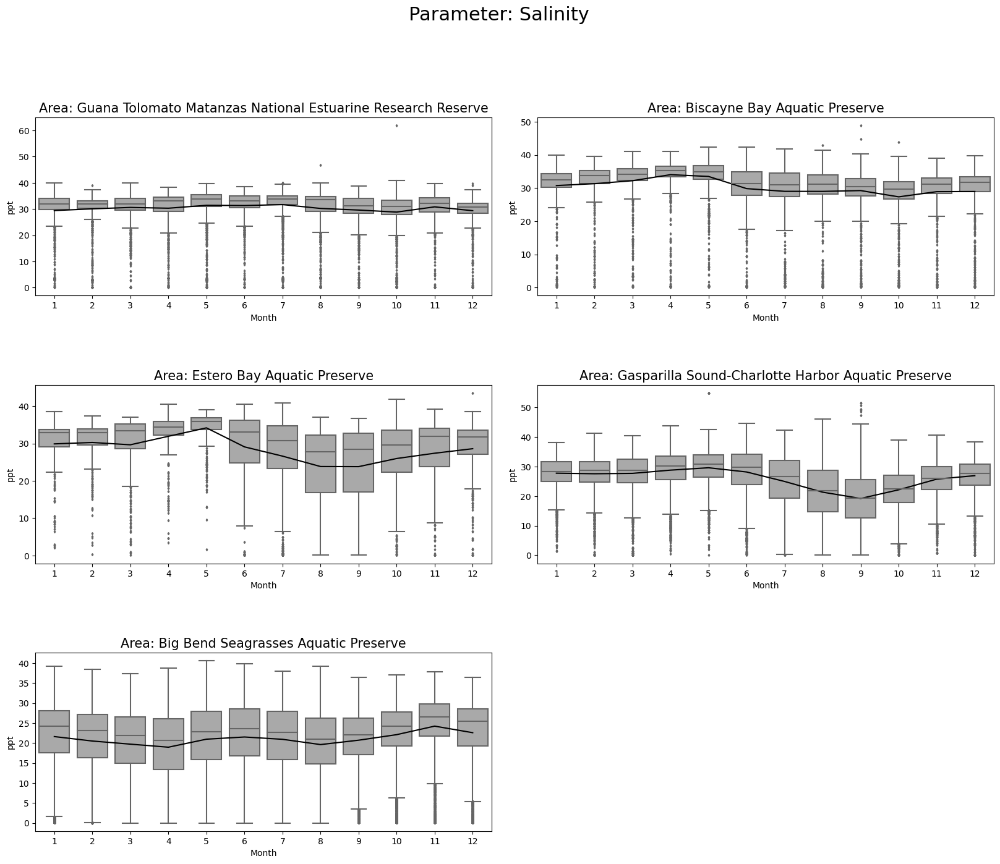

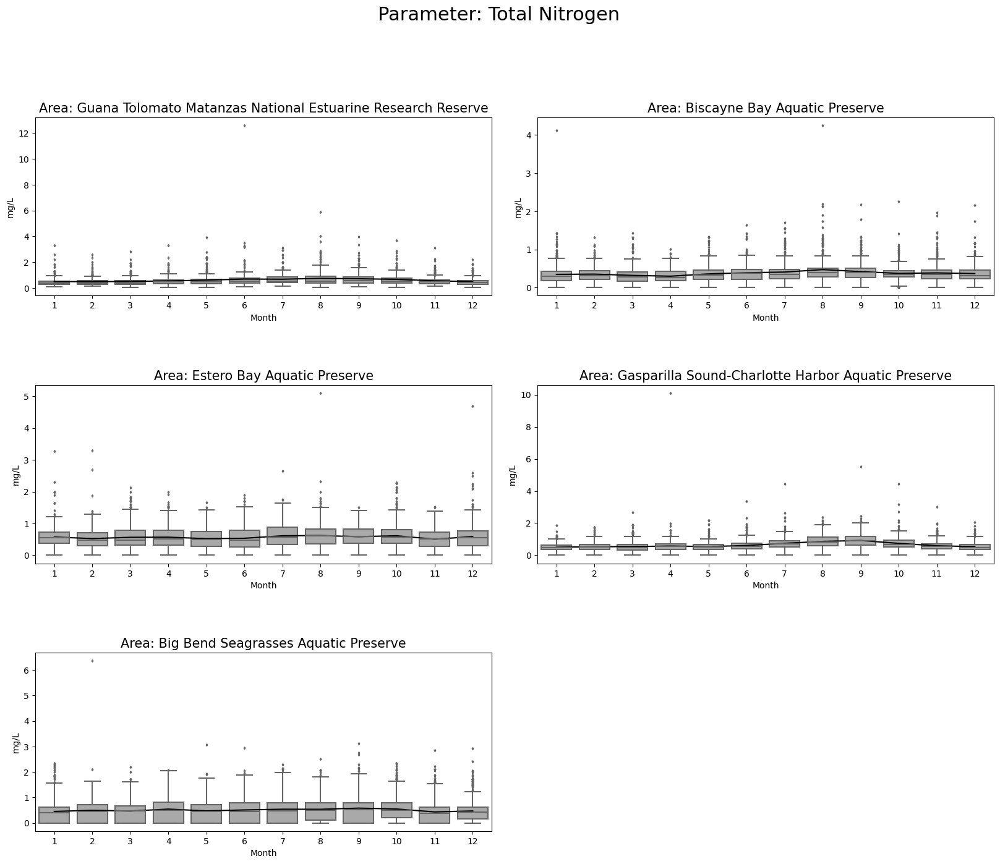

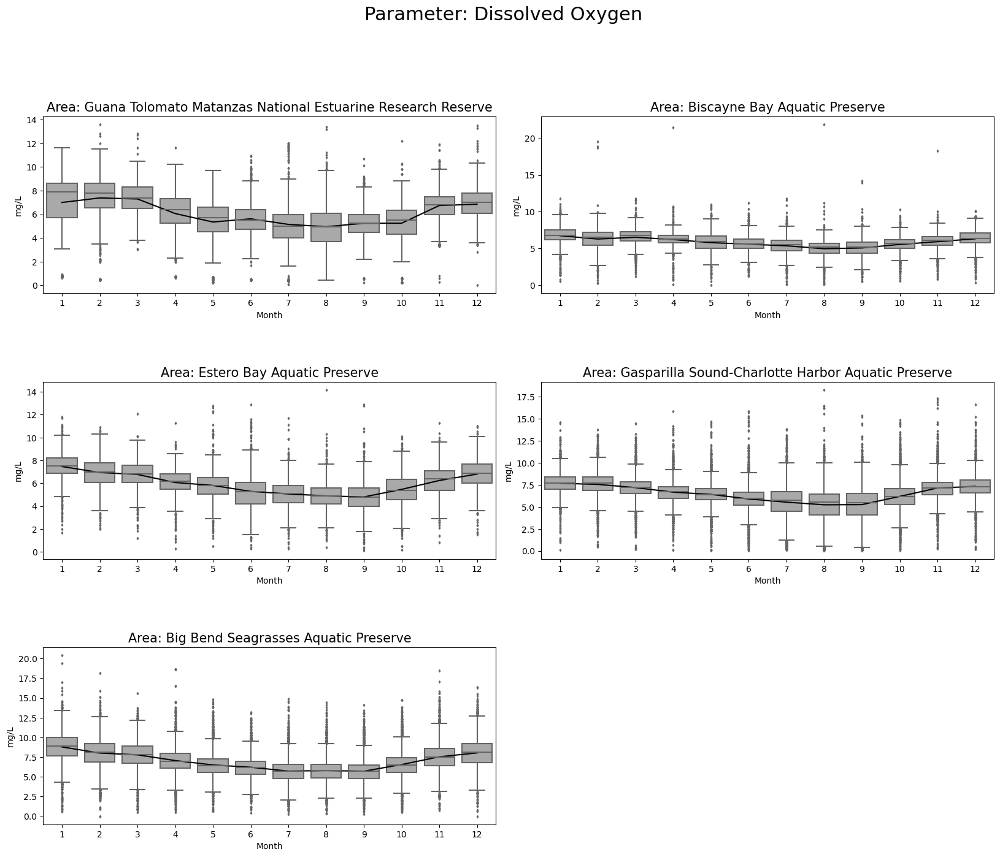

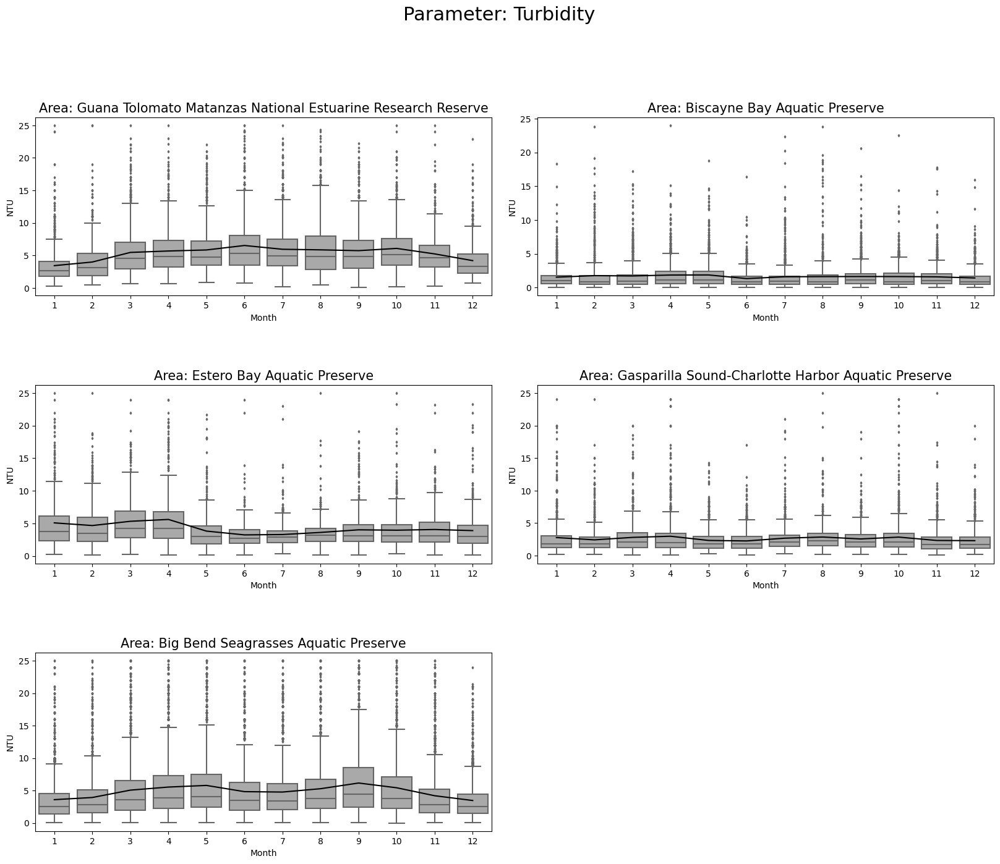

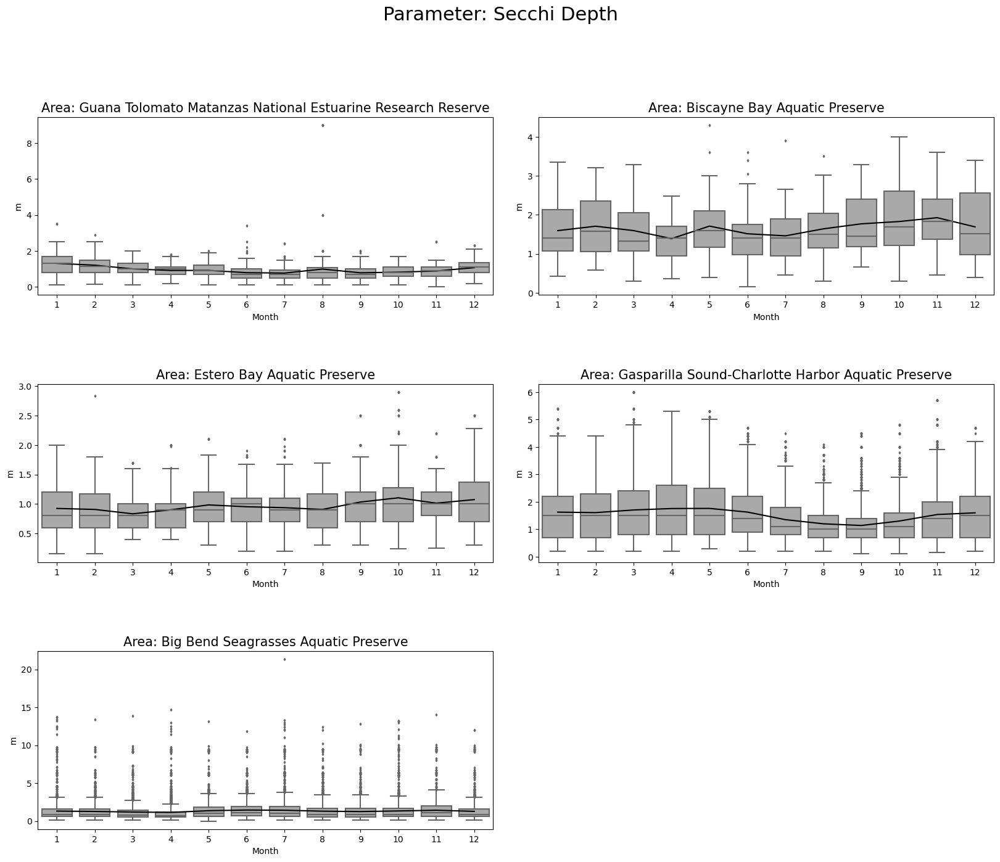

In [13]:
plt.rcParams['figure.figsize'] = [20, 15]
# Group the data by each month
df3 = df2.groupby(["Month","ManagedAreaName","ParameterName"])["ResultValue"].agg([
    "count","max","min","mean","std"]).reset_index()


for para in listPara:
    fig = plt.figure()
    plt.suptitle("Parameter: {}".format(para), fontsize = 22, y = 1)
    i=0
    for area in listArea:
        df4 = df2[(df2["ManagedAreaName"]==area)&(df2["ParameterName"]==para)]
        df3_slct = df3[(df3["ManagedAreaName"]==area)&(df3["ParameterName"]==para)]

        ax = fig.add_subplot(3,2,i+1)

        sns.boxplot(x=df4["Month"], y=df4["ResultValue"],orient='v',color='darkgray',fliersize=2,ax = ax)
        sns.lineplot(x=df3_slct["Month"]-1, y=df3_slct["mean"],color='black',ax=ax)
        ax.set_title("Area: {}".format(area), size=15) # Title
        i = i+1
        plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.1, hspace=0.5)
        plt.ylabel(dictUnits[para])

## 3. Fixed and random sampling locations

This step is to calculate the sample location of Salinity in five areas and to calculate whether they are fixed points or random points.


### 3.1 Distribution of repeatitive samples at unique locations
First, aggregate the data by location and parameter name.

In [14]:
plt.rcParams['figure.figsize'] = [16, 8]

dfLoc  = df2.groupby(['Latitude_DD','Longitude_DD',"ParameterName","ManagedAreaName","Year","Month"])["ResultValue"].agg("count").reset_index()

dfLoc = dfLoc.rename(columns={"ResultValue": "samples"})

dfLoc.loc[dfLoc["samples"] == 1,['sample_type']] ='Random Point'
dfLoc.loc[dfLoc["samples"] > 1,['sample_type']] ='Fixed Point'

Plot histograms of samples at unique positions.

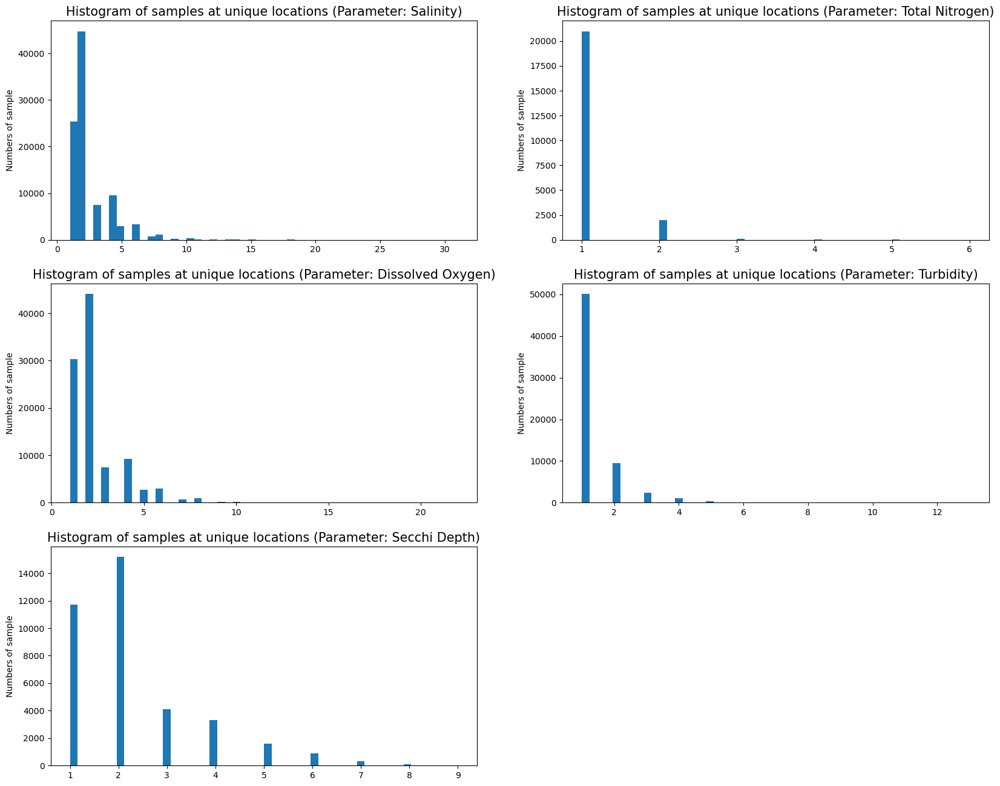

In [15]:
plt.rcParams['figure.figsize'] = [20, 16]

i = 0

fig = plt.figure()
for para in listPara:
    dfNew = dfLoc[dfLoc['ParameterName']==para]
    ax = fig.add_subplot(3,2,i+1)
    ax.set_title("Histogram of samples at unique locations (Parameter: {})".format(para), size=15) # Title  
    ax.hist(dfNew["samples"],bins=50)

    i=i+1
    plt.ylabel("Numbers of sample")

### 3.2 Proportions of random  sampling (1 sample) and fixed sampling (>1 samples) locations 

Plot pie charts of fixed samples and random samples

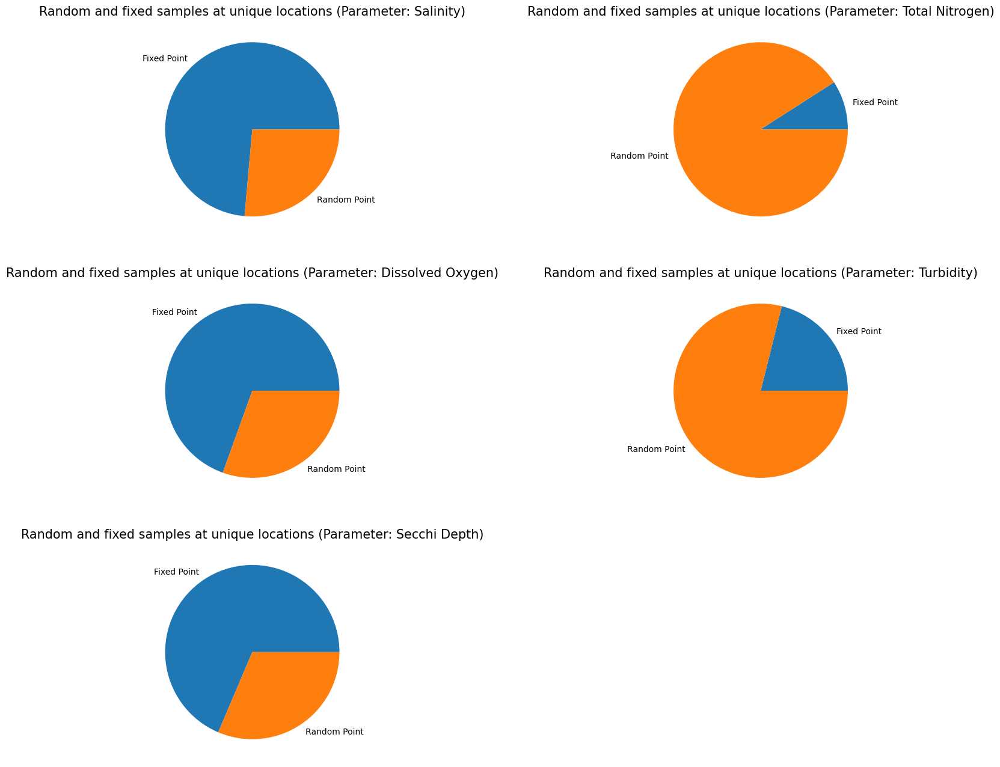

In [16]:
plt.rcParams['figure.figsize'] = [20, 16]

i = 0

fig = plt.figure()

for para in listPara:
    dfNew = dfLoc[dfLoc['ParameterName']==para]
    dfNew_agg = dfNew.groupby(['sample_type'])['samples'].agg("count").reset_index()
    ax = fig.add_subplot(3,2,i+1)
    ax.set_title("Random and fixed samples at unique locations (Parameter: {})".format(para), size=15) # Title  
    ax.pie(x = dfNew_agg["samples"],labels = dfNew_agg["sample_type"])

    i=i+1

Create bar chart to show ratios of fixed sampling locations in five managed areas

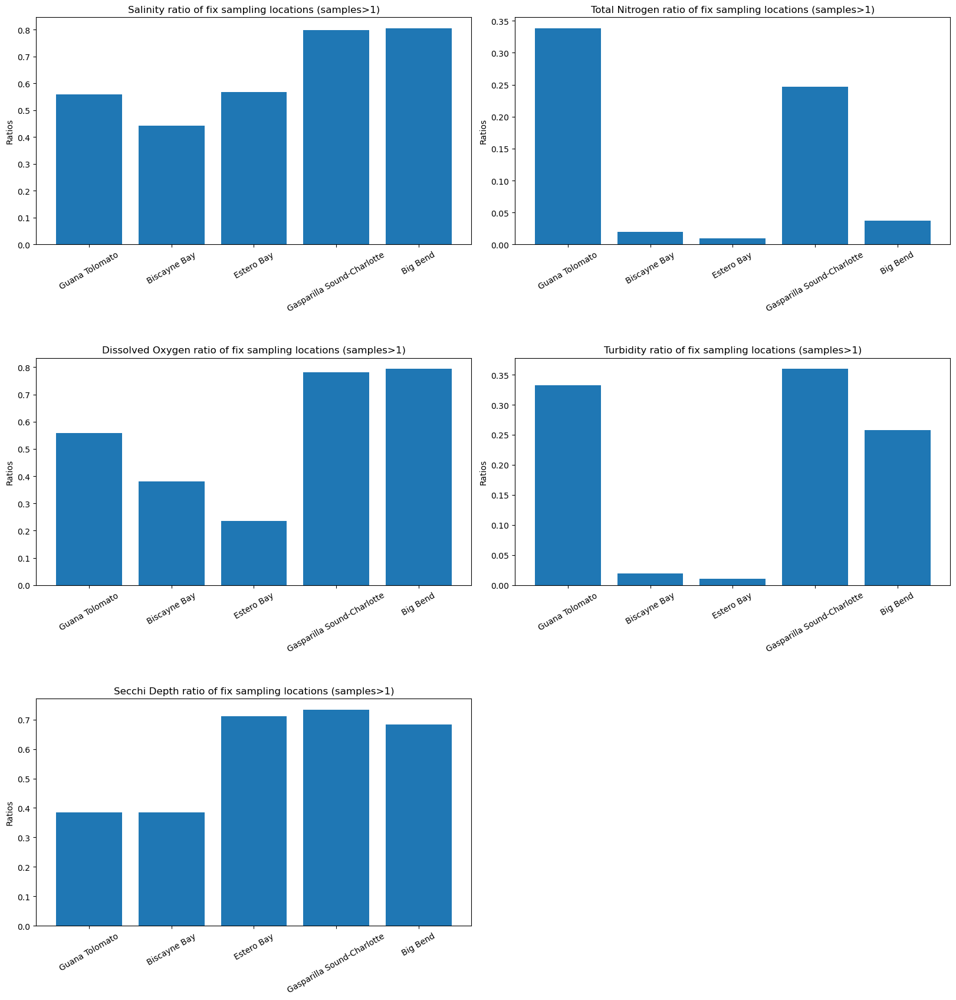

In [17]:
# This step is to calculate the ratios of fix points to total points in five areas.
fig = plt.figure(figsize = (20, 20))
i = 0
for para in listPara:
    list_ratio = []
    listArea_short = [] 
    for area in listArea:
        gdfLocPara = dfLoc[(dfLoc['ParameterName'] == para)&(dfLoc['ManagedAreaName'] == area)]
        allPoints  = gdfLocPara.shape[0]
        randPoints = gdfLocPara.loc[gdfLocPara["sample_type"]=="Fixed Point"].shape[0]
        ratio      = round(randPoints/allPoints,4)
        list_ratio.append(ratio)
        listArea_short.append(area.split(' ')[0] + " "+ area.split(' ')[1])
        
    ax = fig.add_subplot(3,2,i+1)
    plt.bar(listArea_short,list_ratio)
    plt.title(para+" ratio of fix sampling locations (samples>1)")
    plt.xticks(rotation=30)
    plt.ylabel("Ratios")
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.1, hspace=0.5)
    plt.show
    i=i+1

### 3.3 Spatial distribution of random and fixed sampling locations

Convert sampling points of salinity to GeoDataFrame

In [18]:
# Group data by location, parametername and managed area name
gdfLoc = gpd.GeoDataFrame(dfLoc, geometry = gpd.points_from_xy(dfLoc.Longitude_DD, dfLoc.Latitude_DD),crs="EPSG:4326")
gdfLoc.head()

,Latitude_DD,Longitude_DD,ParameterName,ManagedAreaName,Year,Month,samples,sample_type,geometry
0,25.289944,-80.332333,Dissolved Oxygen,Biscayne Bay Aquatic Preserve,1970,11,2,Fixed Point,POINT (-80.33233 25.28994)
1,25.289944,-80.332333,Dissolved Oxygen,Biscayne Bay Aquatic Preserve,1970,12,2,Fixed Point,POINT (-80.33233 25.28994)
2,25.290600,-80.369800,Salinity,Biscayne Bay Aquatic Preserve,1996,6,2,Fixed Point,POINT (-80.36980 25.29060)
3,25.296300,-80.325500,Dissolved Oxygen,Biscayne Bay Aquatic Preserve,2021,1,3,Fixed Point,POINT (-80.32550 25.29630)
4,25.296300,-80.325500,Salinity,Biscayne Bay Aquatic Preserve,2021,1,3,Fixed Point,POINT (-80.32550 25.29630)


Plot fixed and random sampling location in each managed aera

C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1718: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(ms, UserWarning)
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1719: UserWarning: Warning: setting k to 2
  Warn("Warning: setting k to %d" % uvk, UserWarning)
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1718: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(ms, UserWarning)
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1719: UserWarning: Warning: setting k to 3
  Warn("Warning: setting k to %d" % uvk, UserWarning)
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1718: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(ms, UserWarning)
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1719: UserWarning: Warning

C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1718: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(ms, UserWarning)
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1719: UserWarning: Warning: setting k to 2
  Warn("Warning: setting k to %d" % uvk, UserWarning)
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1718: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(ms, UserWarning)
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1719: UserWarning: Warning: setting k to 3
  Warn("Warning: setting k to %d" % uvk, UserWarning)
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1718: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(ms, UserWarning)
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1719: UserWarning: Warning

C:\Users\xiang11\.conda\envs\geo\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1718: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(ms, UserWarning)
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\mapclassify\classifiers.py:1719: UserWarning: Warning: setting k to 3
  Warn("Warning: setting k to %d" % uvk, UserWarning)
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\

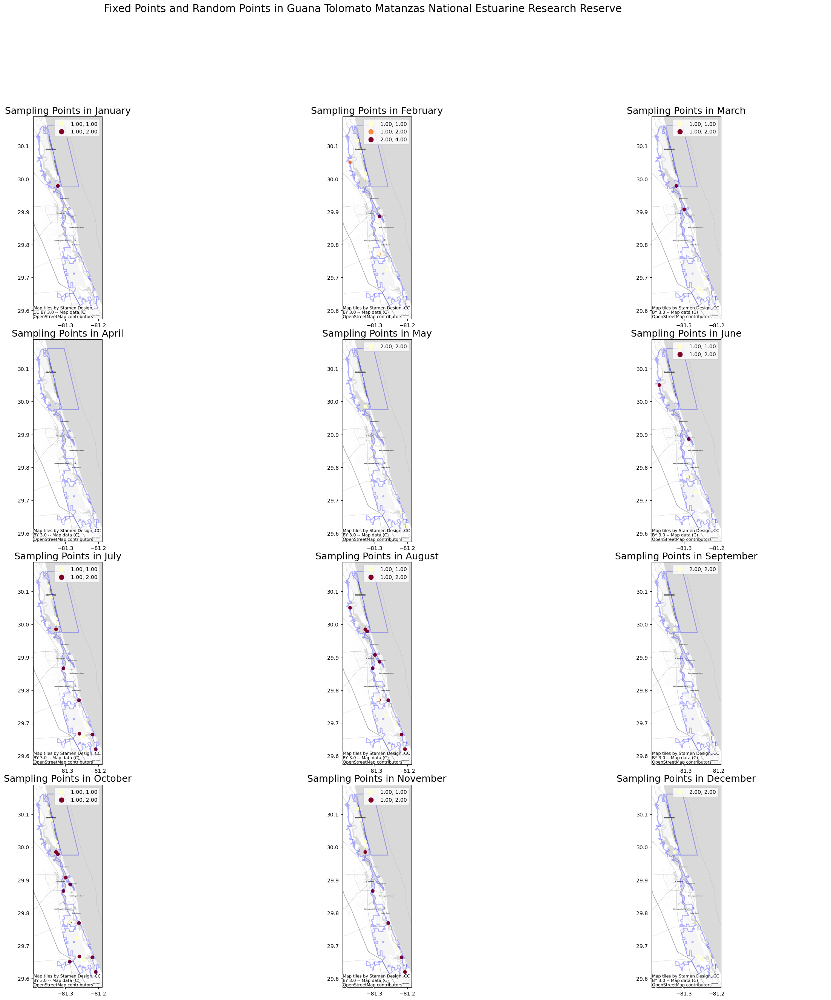

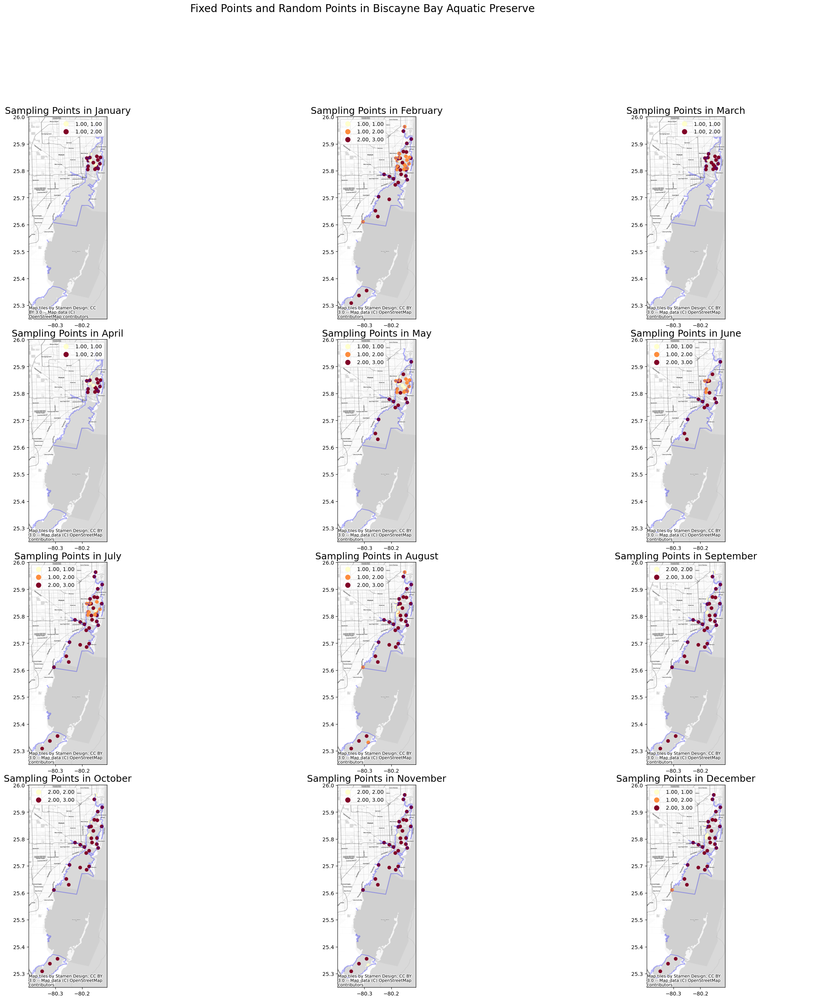

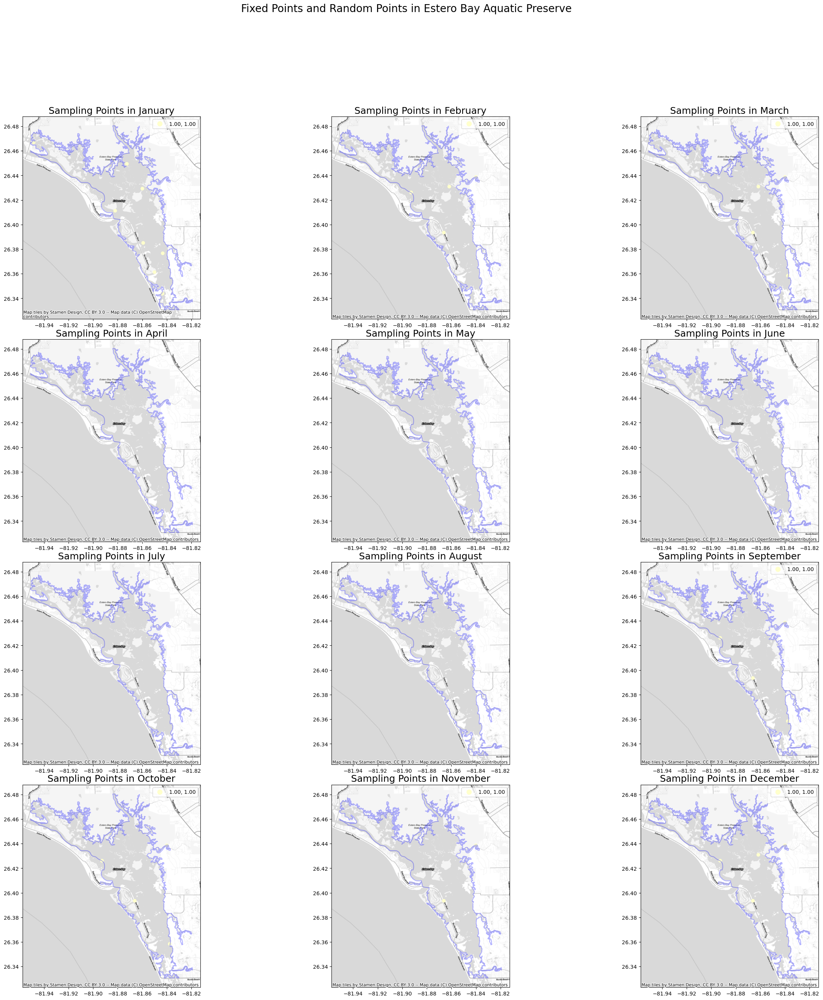

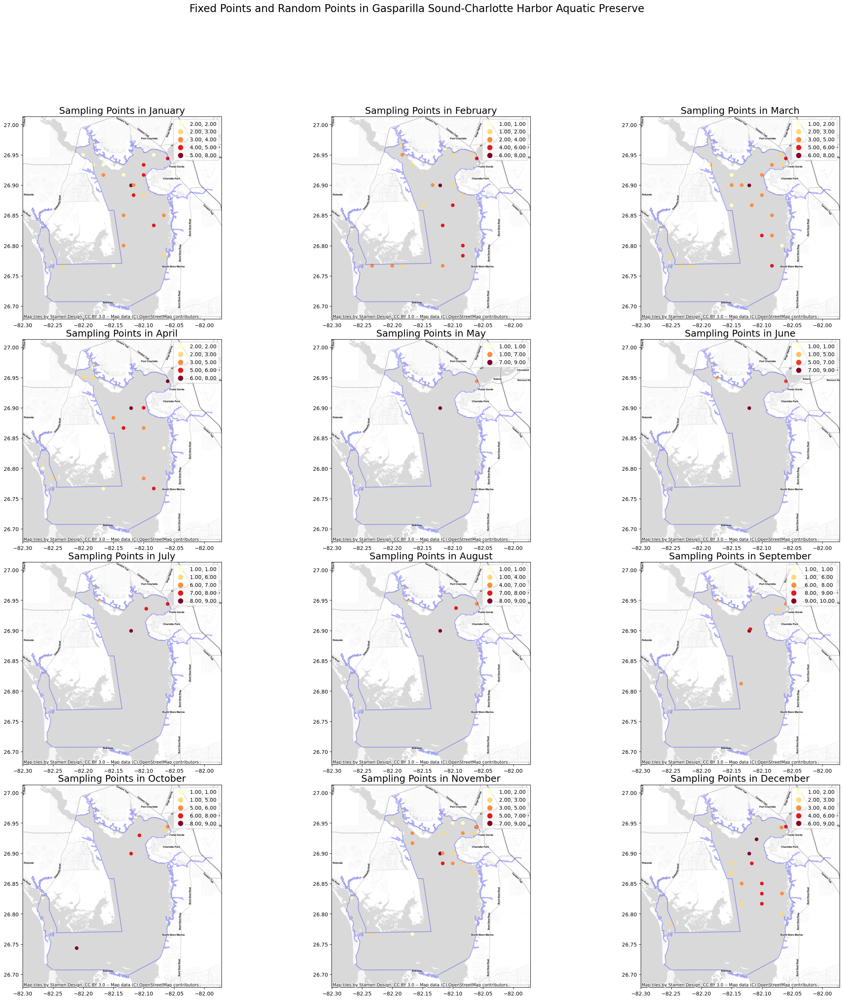

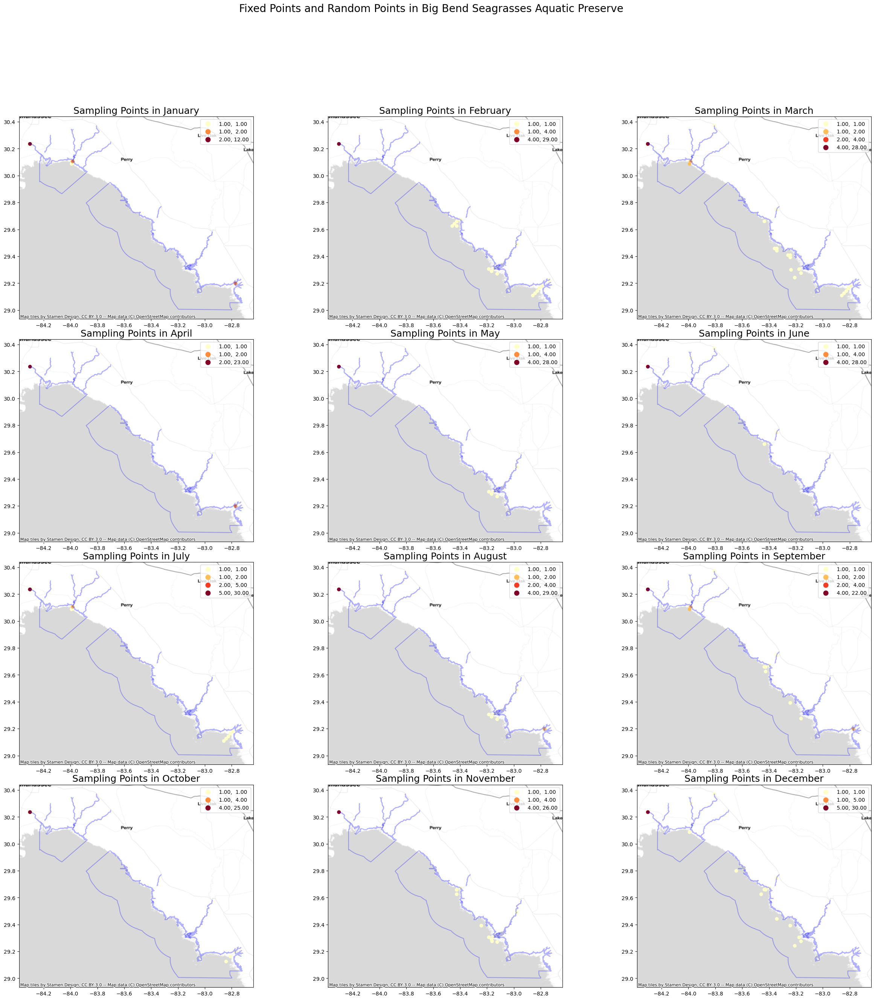

In [21]:
plt.rcParams['figure.figsize'] = [30,30]
for area in listArea:
    fig = plt.figure()
    plt.suptitle("Fixed Points and Random Points in "+area, fontsize = 20)
    gdfLocPara = gdfLoc[(gdfLoc['ParameterName']=='Salinity')&(gdfLoc["Year"]==2020)&(gdfLoc["ManagedAreaName"]==area)]
    areaSelect = areaShp[areaShp["LONG_NAME"]==area]
    for i in range(1,13):
        areaPoint = gdfLocPara[gdfLocPara["Month"]==i]
        ax = fig.add_subplot(4,3,i)
        areaPoint.plot(column ='samples',k=5,cmap="YlOrRd",scheme = 'NaturalBreaks',
                       marker="o",legend=True,ax=ax)
        ax.set_title("Sampling Points in "+dictMonth[i],size=18)
        areaSelect.boundary.plot(alpha=0.3,facecolors='none',edgecolors='blue',ax=ax)
        cx.add_basemap(ax,source=cx.providers.Stamen.TonerLite,crs="EPSG:4326")
        plt.subplots_adjust(left=None, bottom=None, right=None, top=None, hspace=0.1)
        plt.show